In [28]:
%matplotlib inline

In [29]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [30]:
import random
import string
import pandas as pd
import numpy as np

In [31]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [32]:
import torch
import socket
from IPython.display import clear_output

In [33]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 0

In [34]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [35]:
LOCATION = 'tokyo'
NAME       = 'V1_'+ LOCATION.upper()+datetime.now().strftime("_%H_%M_%S")
MODELNAME  = NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", NAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  V1_TOKYO_10_30_34
SEED  :  0
HOST  :  19c994a59e65
START :  2019-06-21 10:30:34.256811


In [36]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True
                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [37]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = self.v_btrack.mean()
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - 0.25*self.BMAX):
            reward = 1.5-np.abs(bdev)/self.BMAX*5
        else:
            reward = 2
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
        if(self.day_violation_flag):
            violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return (reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        
        v_batt = self.binit + self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
        self.v_btrack = np.append(self.v_btrack, v_batt) #track battery levels
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
#         if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [38]:
# Hyper Parameters
print("HYPER PARAMS")
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NO_OF_ITERATIONS    = 20
GPU                 = False         # device
HELP                = 0.05

HYPER PARAMS


In [39]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device
#         print("Neural net")
#         print(self.eval_net)
        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
#         self.optimizer = torch.optim.RMSprop(self.eval_net.parameters(), lr=LR, alpha=0.95, eps=1e-2, weight_decay=0, momentum=0, centered=False)
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        
#         self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
#         self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR, weight_decay=WT_DECAY)
#         self.loss_func = nn.SmoothL1Loss()
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy()
        action = action[0] # return the argmax index
        if np.random.uniform() > EPSILON:   # greedy
#             action += np.random.randint(-3, 3)
#             action = int(np.clip(action, 0, N_ACTIONS-1))
            action = np.random.randint(0,N_ACTIONS-1)
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if True:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [40]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]


In [41]:
#CONSTANTS
LOCATION = 'tokyo'
YEAR = 2010
capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
print("BMIN       = ", capm.BMIN)
print("BMAX       = ", capm.BMAX)
print("BOPT       = ", capm.BOPT)
print("BLIM_LO    = ", capm.BLIM_LO)
print("BLIM_HI    = ", capm.BLIM_HI)
print("BSAFE_LO   = ", capm.BSAFE_LO)
print("BSAFE_HI   = ", capm.BSAFE_HI)
print("ENP_MARGIN = ", capm.ENP_MARGIN)

BMIN       =  0.0
BMAX       =  10000.0
BOPT       =  5000.0
BLIM_LO    =  1500.0
BLIM_HI    =  8500.0
BSAFE_LO   =  3500.0
BSAFE_HI   =  6500.0
ENP_MARGIN =  3000.0


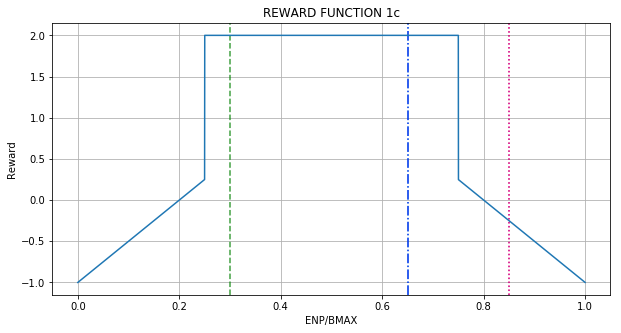

RF_1c(0)            =  -1.00
RF_1c(ENP_MARGIN/4) =  -1.00
RF_1c(ENP_MARGIN/2) =  -1.00
RF_1c(ENP_MARGIN)   =  -1.00

RF_1c(BMAX/2) =  -1.00
RF_1c(BMAX)   =  -1.00



In [42]:
#PLOT REWARD FUNCTIONS
x = np.arange(0,capm.BMAX)
y = np.array([capm.rewardfn() for capm.v_btrack in x])

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.set_title('REWARD FUNCTION 1c')
ax.set_xlabel('ENP/BMAX')
ax.set_ylabel('Reward')
ax.axvline((capm.ENP_MARGIN)/capm.BMAX, color='g',alpha=0.75, linestyle='--')
ax.axvline(1-(capm.BSAFE_LO)/capm.BMAX, color='c',alpha=0.75, linestyle='-.')
ax.axvline(  (capm.BSAFE_HI)/capm.BMAX, color='b',alpha=0.75, linestyle="-.")
ax.axvline(1- (capm.BLIM_LO)/capm.BMAX, color='r',alpha=0.75, linestyle=':')
ax.axvline(   (capm.BLIM_HI)/capm.BMAX, color='m',alpha=0.75, linestyle=":")
ax.plot(x/capm.BMAX,y)
ax.grid(True)
plt.show()

capm.enp = 0;            print("RF_1c(0)            = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/4; print("RF_1c(ENP_MARGIN/4) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/2; print("RF_1c(ENP_MARGIN/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN;   print("RF_1c(ENP_MARGIN)   = {:6.2f}".format(capm.rewardfn()) )
print("");
capm.enp = capm.BMAX/2; print("RF_1c(BMAX/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.BMAX;   print("RF_1c(BMAX)   = {:6.2f}".format(capm.rewardfn()) )
print("");

In [43]:
#TRAINING STARTS
tic = datetime.now()

Device:  cpu

Iteration 0:  TOKYO, 2000 
EPSILON = 5.000e-01
LR = 1.000e-04
Average Terminal Reward  = -2.255
Day Violations           =    236
Battery Limit Violations =   2938
Battery FULL Violations  =     20
Battery EMPTY Violations =   2918
MAX NN INPUTS:   1.000   0.899   1.182   0.648
MIN NN INPUTS:  -1.000  -0.974  -0.636  -0.833


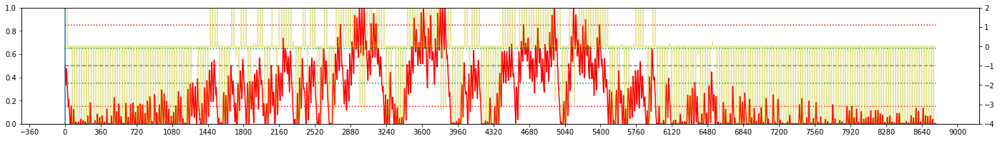

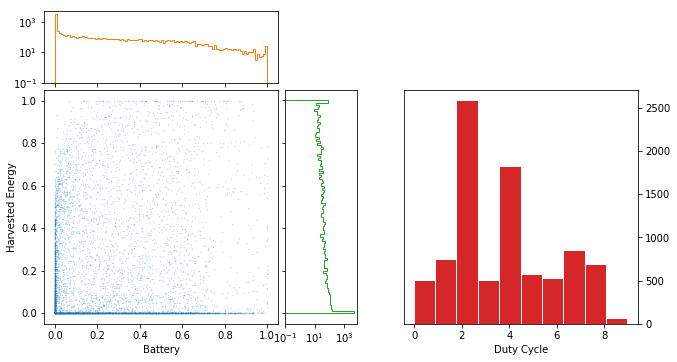


Iteration 1:  TOKYO, 2000 
EPSILON = 5.500e-01
LR = 1.000e-04
Average Terminal Reward  = -2.151
Day Violations           =    230
Battery Limit Violations =   2919
Battery FULL Violations  =     10
Battery EMPTY Violations =   2909
MAX NN INPUTS:   1.000   0.874   1.182   0.648
MIN NN INPUTS:  -1.000  -0.961  -0.636  -0.833


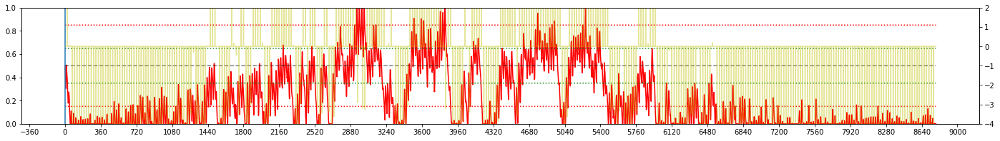

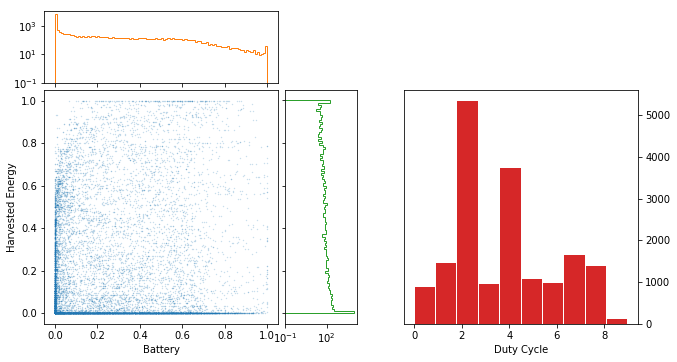


Iteration 2:  TOKYO, 2000 
EPSILON = 6.000e-01
LR = 1.000e-04
Average Terminal Reward  = -2.134
Day Violations           =    215
Battery Limit Violations =   3047
Battery FULL Violations  =      4
Battery EMPTY Violations =   3043
MAX NN INPUTS:   1.000   0.900   1.182   0.648
MIN NN INPUTS:  -1.000  -1.074  -0.636  -0.833


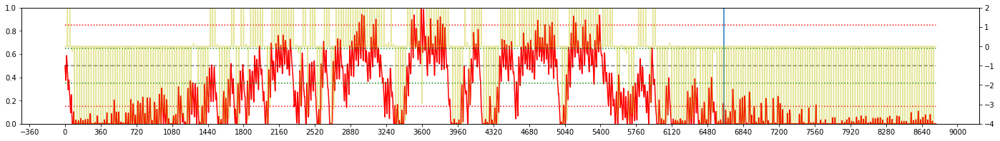

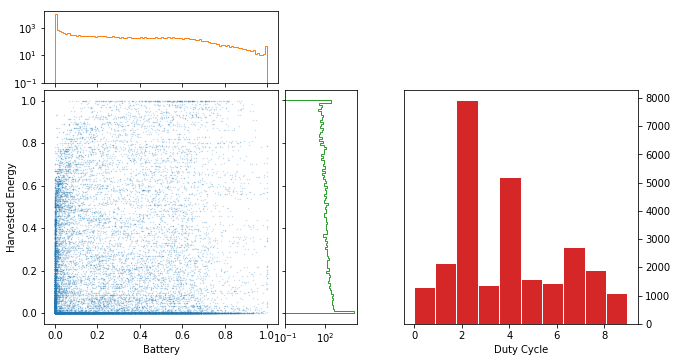


Iteration 3:  TOKYO, 2000 
EPSILON = 6.500e-01
LR = 1.000e-04
Average Terminal Reward  = -1.569
Day Violations           =    197
Battery Limit Violations =   1815
Battery FULL Violations  =    116
Battery EMPTY Violations =   1699
MAX NN INPUTS:   1.000   0.780   1.182   0.648
MIN NN INPUTS:  -1.000  -1.173  -0.636  -0.833


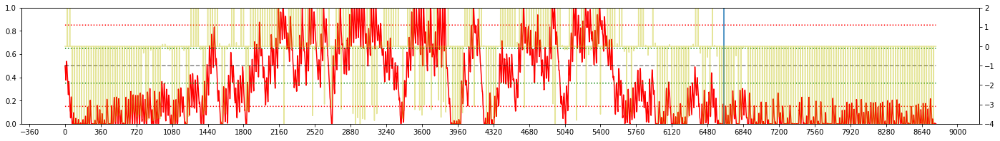

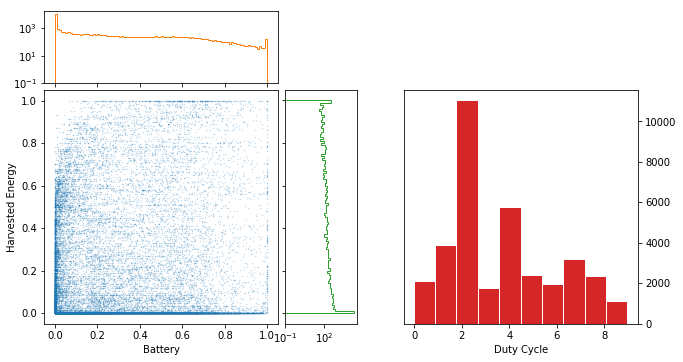

LOSS : 2.935

Iteration 4:  TOKYO, 2000 
EPSILON = 7.000e-01
LR = 1.000e-04
Average Terminal Reward  = -1.385
Day Violations           =    192
Battery Limit Violations =   1569
Battery FULL Violations  =     94
Battery EMPTY Violations =   1475
MAX NN INPUTS:   1.000   0.844   1.182   0.648
MIN NN INPUTS:  -1.000  -1.215  -0.636  -0.833


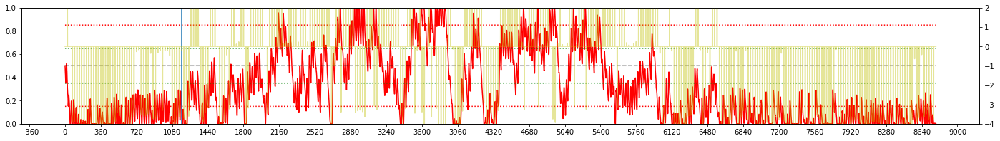

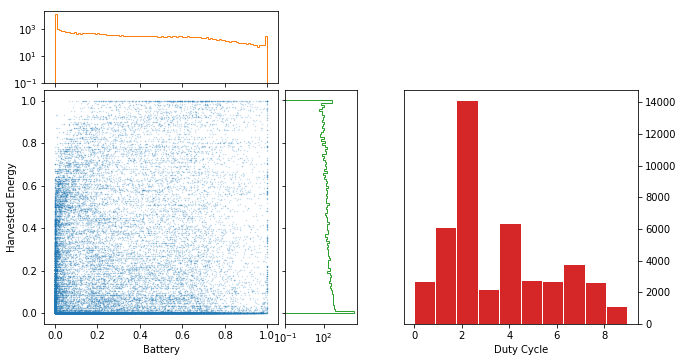

LOSS : 1.999

Iteration 5:  TOKYO, 2000 
EPSILON = 7.500e-01
LR = 1.000e-04
Average Terminal Reward  = -0.913
Day Violations           =    164
Battery Limit Violations =   1408
Battery FULL Violations  =     21
Battery EMPTY Violations =   1387
MAX NN INPUTS:   1.000   1.240   1.182   0.648
MIN NN INPUTS:  -1.000  -1.245  -0.636  -0.833


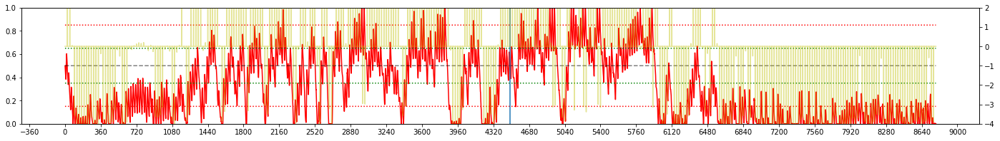

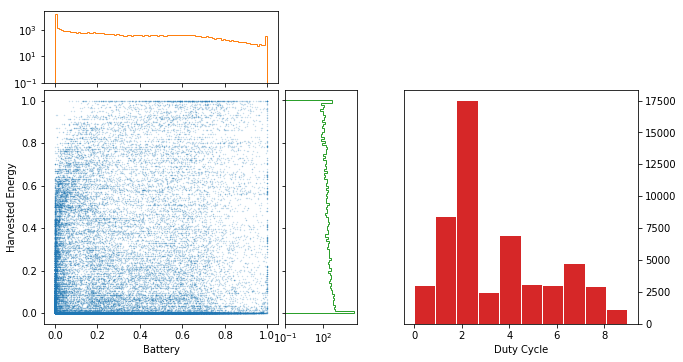

LOSS : 2.034

Iteration 6:  TOKYO, 2000 
EPSILON = 8.000e-01
LR = 1.000e-04
Average Terminal Reward  = -0.720
Day Violations           =    150
Battery Limit Violations =   1441
Battery FULL Violations  =      0
Battery EMPTY Violations =   1441
MAX NN INPUTS:   0.998   1.250   1.182   0.648
MIN NN INPUTS:  -1.000  -1.245  -0.636  -0.833


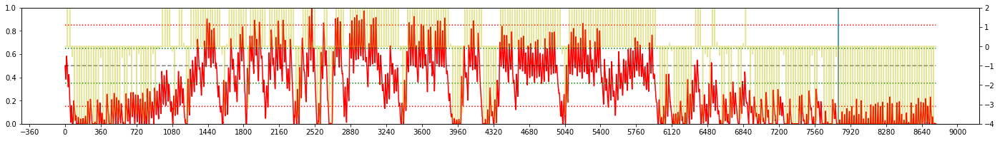

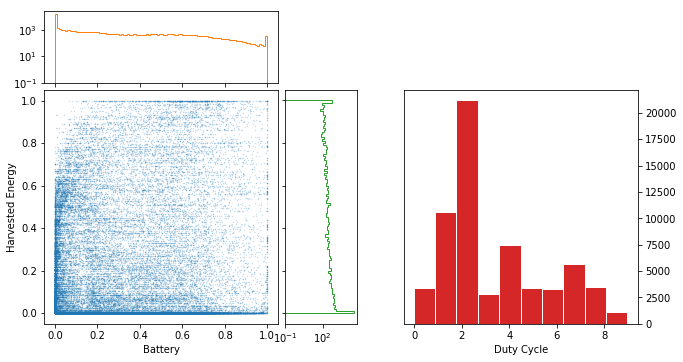


Iteration 7:  TOKYO, 2000 
EPSILON = 8.500e-01
LR = 1.000e-04
Average Terminal Reward  = -0.143
Day Violations           =    112
Battery Limit Violations =    938
Battery FULL Violations  =      0
Battery EMPTY Violations =    938
MAX NN INPUTS:   0.765   0.758   1.182   0.648
MIN NN INPUTS:  -1.000  -1.065  -0.636  -0.833


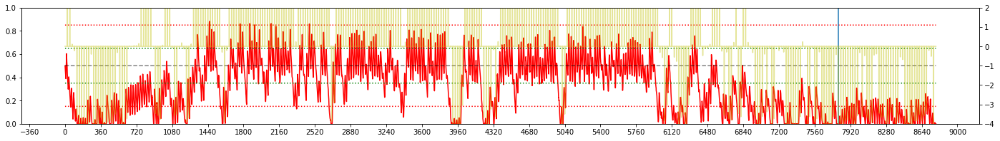

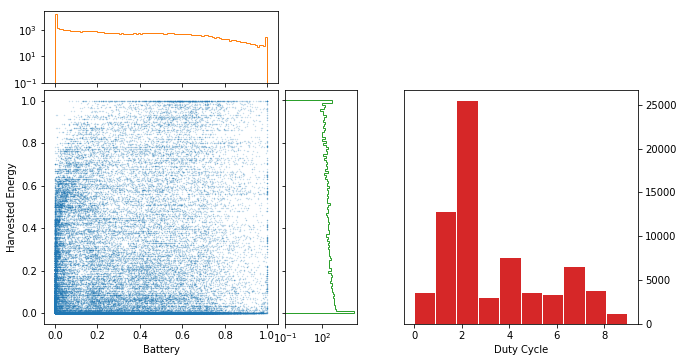

LOSS : 2.135

Iteration 8:  TOKYO, 2000 
EPSILON = 9.000e-01
LR = 1.000e-04
Average Terminal Reward  = -0.271
Day Violations           =    117
Battery Limit Violations =    966
Battery FULL Violations  =     13
Battery EMPTY Violations =    953
MAX NN INPUTS:   1.000   1.295   1.182   0.648
MIN NN INPUTS:  -1.000  -1.005  -0.636  -0.833


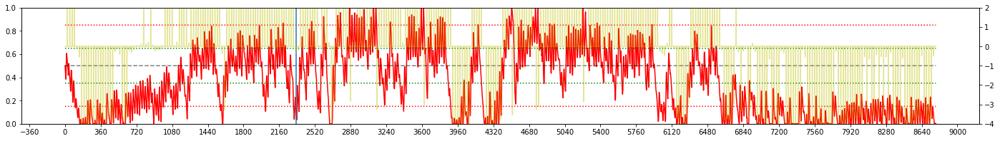

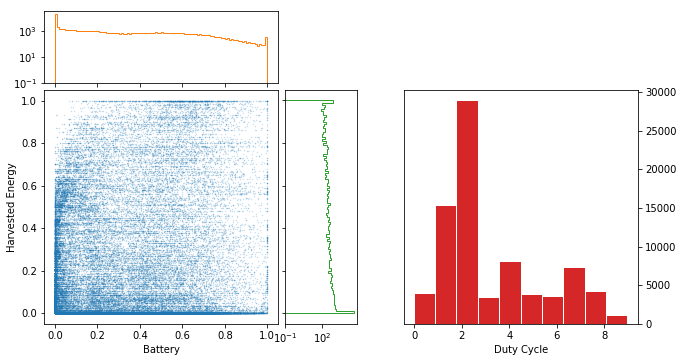

LOSS : 2.445

Iteration 9:  TOKYO, 2000 
EPSILON = 9.500e-01
LR = 1.000e-04
Average Terminal Reward  =  0.040
Day Violations           =    101
Battery Limit Violations =    845
Battery FULL Violations  =     59
Battery EMPTY Violations =    786
MAX NN INPUTS:   1.000   1.087   1.182   0.648
MIN NN INPUTS:  -1.000  -0.871  -0.636  -0.833


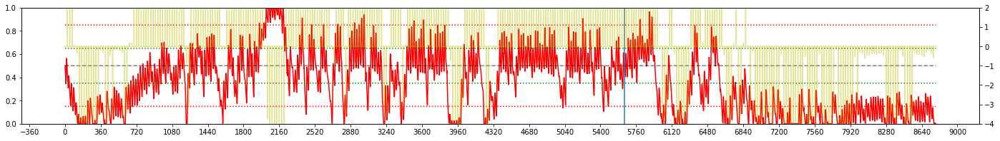

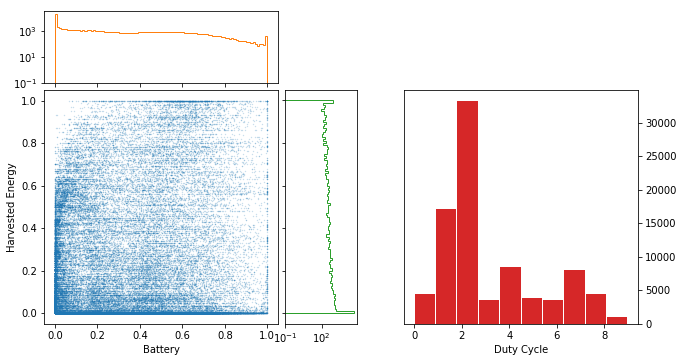


Iteration 10:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.083
Day Violations           =     22
Battery Limit Violations =    167
Battery FULL Violations  =      0
Battery EMPTY Violations =    167
MAX NN INPUTS:   0.820   0.726   1.182   0.648
MIN NN INPUTS:  -1.000  -0.935  -0.636  -0.833


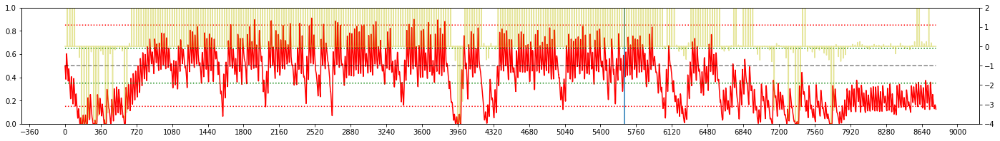

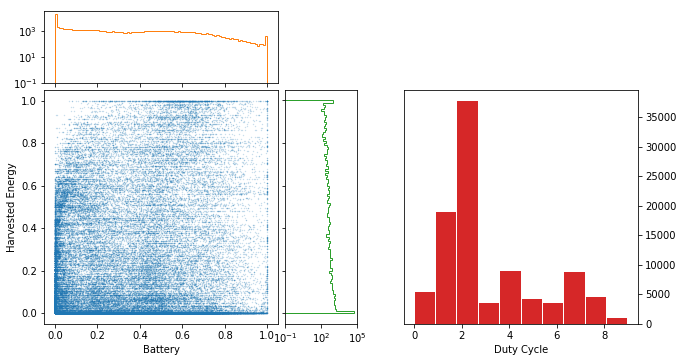

LOSS : 2.926

Iteration 11:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.536
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.827   0.525   1.182   0.648
MIN NN INPUTS:  -0.977  -0.935  -0.636  -0.833


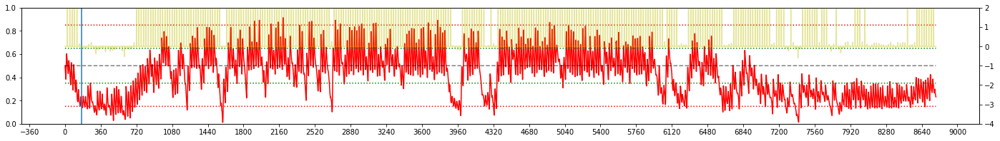

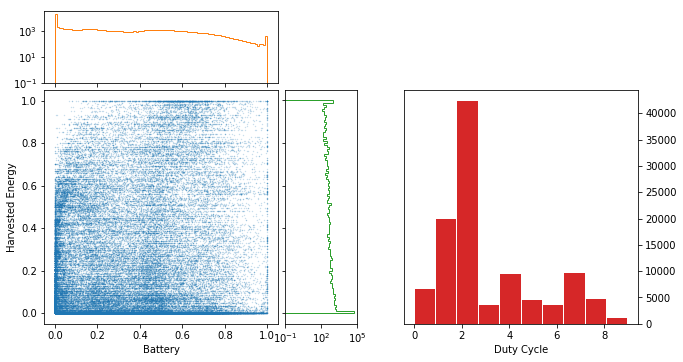

LOSS : 2.692

Iteration 12:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.756
Day Violations           =      1
Battery Limit Violations =      4
Battery FULL Violations  =      0
Battery EMPTY Violations =      4
MAX NN INPUTS:   0.906   0.506   1.182   0.648
MIN NN INPUTS:  -1.000  -0.905  -0.636  -0.833


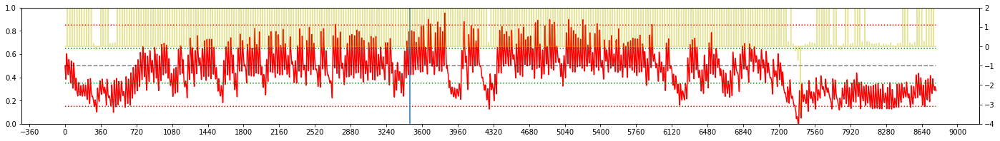

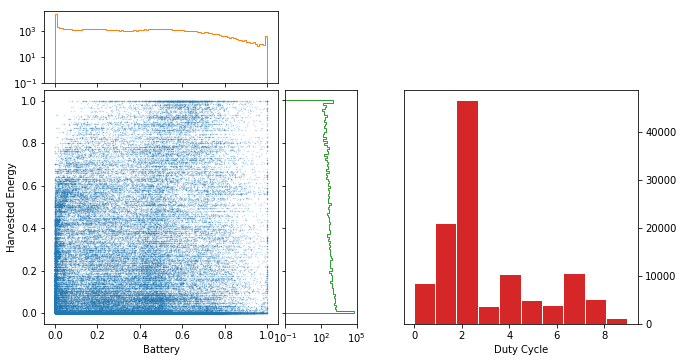

LOSS : 1.835

Iteration 13:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.935
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.718   0.512   1.182   0.648
MIN NN INPUTS:  -0.934  -0.835  -0.636  -0.833


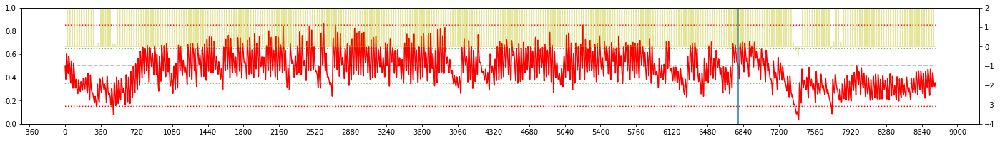

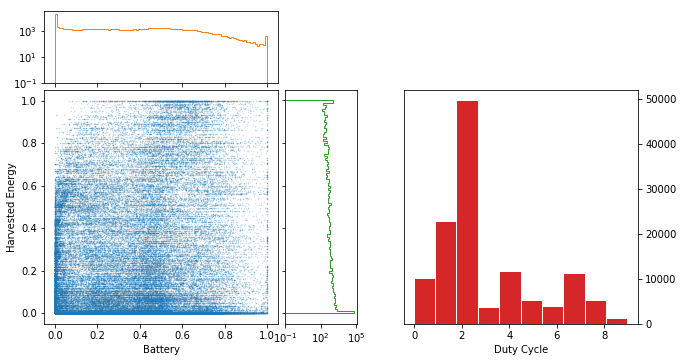


Iteration 14:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.680
Day Violations           =     17
Battery Limit Violations =    165
Battery FULL Violations  =      0
Battery EMPTY Violations =    165
MAX NN INPUTS:   0.749   0.601   1.182   0.648
MIN NN INPUTS:  -1.000  -0.752  -0.636  -0.833


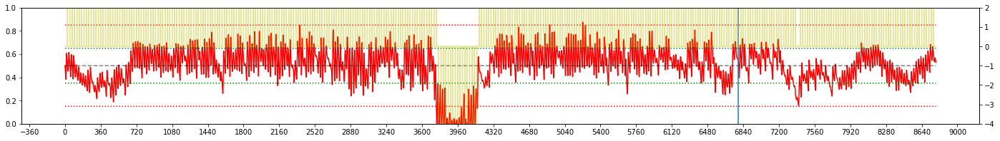

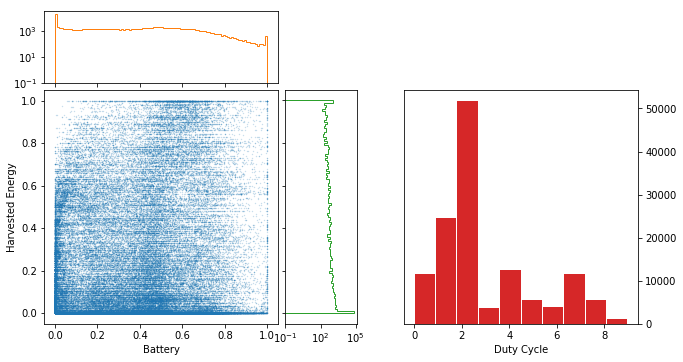

LOSS : 1.106

Iteration 15:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.964
Day Violations           =      2
Battery Limit Violations =      8
Battery FULL Violations  =      0
Battery EMPTY Violations =      8
MAX NN INPUTS:   0.762   1.411   1.182   0.648
MIN NN INPUTS:  -1.000  -0.775  -0.636  -0.833


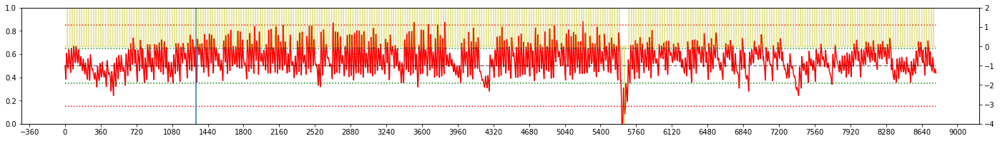

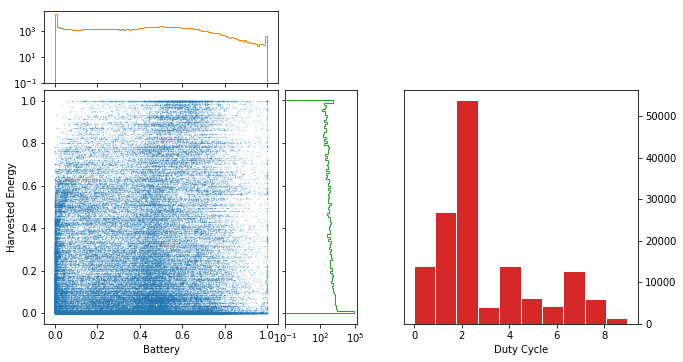

LOSS : 1.062

Iteration 16:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.898
Day Violations           =      6
Battery Limit Violations =     46
Battery FULL Violations  =      0
Battery EMPTY Violations =     46
MAX NN INPUTS:   0.895   1.541   1.182   0.648
MIN NN INPUTS:  -1.000  -0.764  -0.636  -0.833


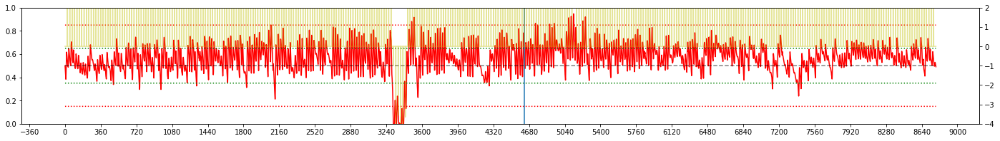

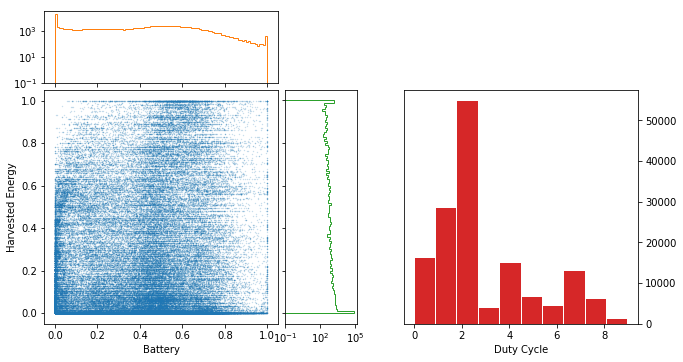

LOSS : 0.874

Iteration 17:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.653
Day Violations           =     20
Battery Limit Violations =    165
Battery FULL Violations  =      0
Battery EMPTY Violations =    165
MAX NN INPUTS:   0.983   1.520   1.182   0.648
MIN NN INPUTS:  -1.000  -0.807  -0.636  -0.833


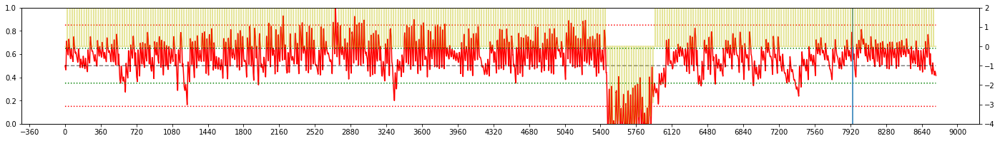

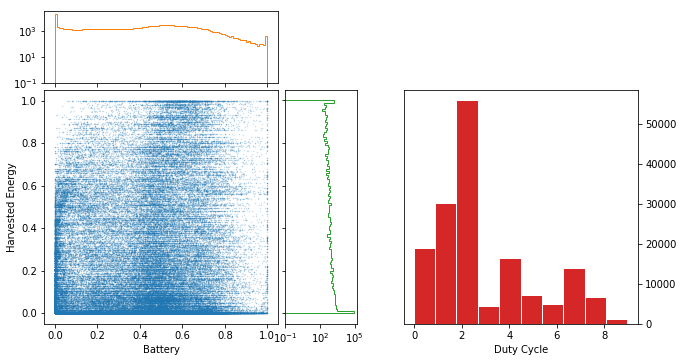


Iteration 18:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.974
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.968   0.795   1.182   0.648
MIN NN INPUTS:  -0.531  -0.867  -0.636  -0.833


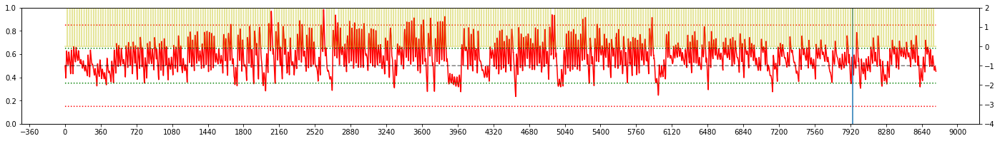

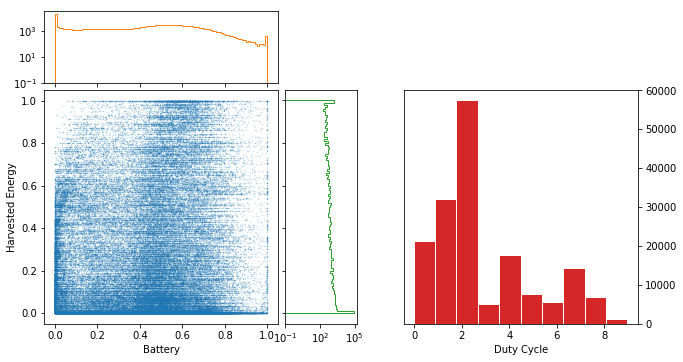

LOSS : 0.981

Iteration 19:  TOKYO, 2000 
EPSILON = 9.900e-01
LR = 1.000e-04
Average Terminal Reward  =  1.959
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.973   1.128   1.182   0.648
MIN NN INPUTS:  -0.701  -0.827  -0.636  -0.833


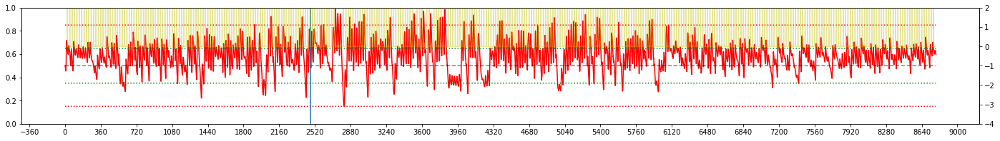

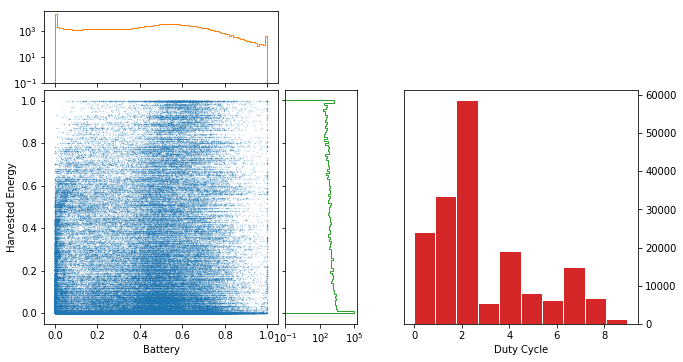

In [17]:
#TRAIN 
dqn = DQN()
# # for recording weights
# oldfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
# old2fc1 = oldfc1

# # oldfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
# # old2fc2 = oldfc2

# # oldfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
# # old2fc3 = oldfc3

# oldout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
# old2out = oldout
# ########################################

change_hr = 0 #when dqn target_net is updated by eval_net
avg_reward_rec = [] #record the yearly average rewards over the entire duration of training
batt_violation_rec = []
day_violation_rec = []

state_space_coverage = np.empty(shape=[0, 2])
action_space_coverage = []

print('Device: ', dqn.device)
#TRAINING STARTS
tic = datetime.now()

e_rec = []
lr_rec = []
for iteration in range(NO_OF_ITERATIONS):
    max_b       = 0
    max_enp     = 0
    max_henergy = 0
    max_fcast   = 0
    
    min_b       = 0
    min_enp     = 0
    min_henergy = 0
    min_fcast   = 0
    


    # EPSILON SCHEDULING
#     EXPLORE_MAX  = 1.0
#     EXPLORE_MIN  = 0.005
#     E_DECAY_RATE = 0.1
#     EPSILON      = 1 - (EXPLORE_MIN + (EXPLORE_MAX - EXPLORE_MIN)*np.exp(-E_DECAY_RATE*iteration))

    e_slope = 0.05
    e_start = 0.5
    EPSILON = np.clip(e_start + e_slope*iteration,0.5,0.99)
    e_rec  = np.append(e_rec,EPSILON)


    # LR SCEHDULING
#     LR_START      = 2.5E-5
#     LR_END        = 1E-6
#     L_DECAY_RATE  = 0.03
#     lrate         = LR_END + (LR_START - LR_END)*np.exp(-L_DECAY_RATE*iteration)
#     dqn.optimizer = torch.optim.RMSprop(dqn.eval_net.parameters(), lr=lrate, alpha=0.95, eps=1e-2, weight_decay=0, momentum=0, centered=False)

#     lr_slope = 3
#     lr_start = 0
#     lr_inflection_point = 2
#     if iteration <=50:
#         lrate =  (lr_start + (1-lr_start)/(1 + np.exp(-(iteration-lr_inflection_point)/lr_slope)))*1e-4
#     else:
#         lrate = 0.95*(lrate-lrate*0.1)+0.2*1e-5
#     dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate)
    lrate = LR
    lr_rec        = np.append(lr_rec,lrate)

    LOCATION    = 'tokyo'#random.choice(['tokyo','wakkanai','minamidaito'])
    YEAR        = 2000#random.choice(np.arange(2000,2010))
    
    capm        = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno    = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX   = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object


    s, r, day_end, year_end = capm.reset()
    yr_record      = np.empty(4)
    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        state_space_coverage = np.append(state_space_coverage, [[s[0], s[2]]], axis=0)

        s0, s1, s2, s3 = stdize(s)
#         print(s3)
#         print(s0,s1,s2,s3)
        max_b       = max(max_b,s0)
        max_enp     = max(max_enp,s1)
        max_henergy = max(max_henergy,s2)
        max_fcast   = max(max_fcast,s3)
        
        min_b       = min(min_b,s0)
        min_enp     = min(min_enp,s1)
        min_henergy = min(min_henergy,s2)
        min_fcast   = min(min_fcast,s3)
        
        
        a = dqn.choose_action(stdize(s))
        action_space_coverage.append(a)
        
        yr_record = np.vstack((yr_record, [s[0],s[2],r, a]))
        
        # take action
        s_, r, day_end, year_end = capm.step(a)
        
        temp_transitions                = np.hstack((stdize(s), [a, r], stdize(s_)))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5]  = r #broadcast reward to all states
#             decay_factor         = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
#             transition_rec[:,5]  = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if dqn.nettoggle:
            change_hr = capm.eno.day*24+capm.eno.hr #to mark when the DQN is updated.
            dqn.nettoggle = not dqn.nettoggle

        if (year_end):
            break

        # transition to new state
        s = s_

    yr_record = np.delete(yr_record, 0, 0)     #remove the first row which is garbage
    hourly_yr_reward_rec = yr_record[:,2]      #extract reward information from the record array
    yr_reward_rec = hourly_yr_reward_rec[::24] #only consider terminal rewards

    print('\nIteration {}:  {}, {} '.format(iteration, LOCATION.upper(), YEAR))
    print('EPSILON = {:6.3e}'.format(EPSILON))
    for param_group in dqn.optimizer.param_groups:
        print('LR = {:6.3e}'.format(param_group['lr']))
    print("Average Terminal Reward  = {:6.3f}".format(np.mean(yr_reward_rec)))
    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
    print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    print("MAX NN INPUTS: %7.3f %7.3f %7.3f %7.3f" %(max_b,max_enp,max_henergy, max_fcast))
    print("MIN NN INPUTS: %7.3f %7.3f %7.3f %7.3f" %(min_b,min_enp,min_henergy, min_fcast))

#     print("Action MEAN              = {:6.3f}".format(np.mean(yr_record[:,-1] + 1)))
#     print("Action STD DEV           = {:6.3f}".format(np.std(yr_record[:,-1] + 1)))
   
    # Log the average reward in avg_reward_rec to plot later in the learning curve graph figure
    avg_reward_rec      = np.append(avg_reward_rec, np.mean(yr_reward_rec))
    day_violation_rec   = np.append(day_violation_rec, capm.violation_counter)
    batt_violation_rec  = np.append(batt_violation_rec, capm.batt_violations)

# ###########################################################################################
# ###########################################################################################
# #   PLOT battery levels, hourly rewards and the weights
    
    #PLOT BATTERY AND REWARD
    fig = plt.figure(figsize=(24,3))
    TIME_STEPS = capm.eno.TIME_STEPS
    NO_OF_DAYS = capm.eno.NO_OF_DAYS
    DAY_SPACING = 15
    TICK_SPACING = TIME_STEPS*DAY_SPACING
    
    #plot battery
    ax = fig.add_subplot(111)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS),  yr_record[:,0],'r')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BOPT/capm.BMAX, 'k--', alpha=0.5)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
    ax.set_ylim([0,1])
    ax.axvline(x=change_hr)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING))

    #plot hourly reward
    ax0 = ax.twinx()
    ax0.plot(hourly_yr_reward_rec, color='y',alpha=0.4)
    ax0.set_ylim(-4,2)
    
    plt.show()
# ###########################################################################################
# ###########################################################################################
# PLOT STATE-SPACE COVERAGE
    from figplot import figplot
    figplot(state_space_coverage, action_space_coverage)
# # #################################################################
#     # PLOT WEIGHTS
#     fig = plt.figure(figsize=(18,6))

#     ax1 = fig.add_subplot(211)
#     newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newfc1.shape[0])
#     ax1.bar(xaxis, old2fc1, color='b', alpha = 0.3)
#     ax1.bar(xaxis, oldfc1,  color='b', alpha = 0.5)
#     ax1.bar(xaxis, newfc1,  color='b', alpha = 1.0)
#     ax1.set_title("FC1")
# #     ax1.set_ylim([-4,4])
#     ax1.set_ylabel("Weight Value")

#     axO = fig.add_subplot(212)
#     newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newout.shape[0])
#     axO.bar(xaxis, old2out, color='g', alpha = 0.3)
#     axO.bar(xaxis, oldout,  color='g', alpha = 0.5)
#     axO.bar(xaxis, newout,  color='g', alpha = 1.0)
#     axO.set_title("FC OUT")
# #     axO.set_ylim([-4,4])
#     axO.set_ylabel("Weight Value")

#     fig.tight_layout()
#     plt.show()
# # #################################################################

#     # PLOT HISTOGRAM OF WEIGHTS
#     fig = plt.figure(figsize=(18,6))

#     ax1 = fig.add_subplot(211)
#     newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newfc1.shape[0])
# #     ax1.hist(old2fc1, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.1 )
# #     ax1.hist(oldfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.3 )
#     ax1.hist(newfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.6 )
#     ax1.set_title("FC1")
#     ax1.set_xlabel("Weight Value")


#     axO = fig.add_subplot(212)
#     newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newout.shape[0])
# #     axO.hist(old2out, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.1)
# #     axO.hist(oldout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.3)
#     axO.hist(newout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.6)
#     axO.set_title("FC OUT")
#     axO.set_xlabel("Weight Value")


#     fig.tight_layout()
#     plt.show()
# # #################################################################    
    
#     old2fc1 = oldfc1
#     oldfc1 = newfc1
    
#     old2out = oldout
#     oldout = newout

    # End of training

In [18]:
print('Train time: {}\n'.format(datetime.now() - tic))
save_file = './models/'+ MODELNAME
torch.save(dqn.eval_net.state_dict(), save_file)

Train time: 0:03:58.721290



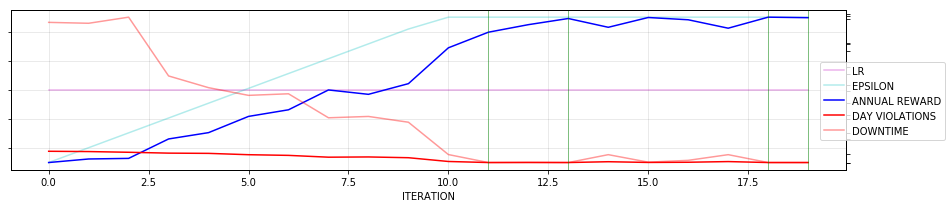

In [19]:
###########################################################################################
###########################################################################################

#PLOT LR AND EPSILON SCHEDULING
fig = plt.figure(figsize=(12,3))
ax = fig.add_subplot(111)
# ax.set_title("LR and EPSILON SCHEDULING V3")
ax.set_xlabel("ITERATION")
# ax.set_ylabel("LR",      color = 'm')
ax.plot(lr_rec,          color = 'm', alpha = 0.3,label="LR")
# ax.tick_params(axis='y', color = 'm')
# ax.ticklabel_format(style='sci', axis='y', scilimits=(-6,-7))
# ax.minorticks_on()

# ax.set_axisbelow(True)
ax.yaxis.set_ticklabels([])

ax.grid(b=True, which='minor', linestyle=':',  color='k', alpha = 0.1)
ax.grid(b=True, which='major', linestyle='-',  color='k', alpha = 0.1)

ax_ = ax.twinx()
# ax_.set_ylabel("EPSILON", color = 'c')
# ax_.tick_params(axis='y', color = 'c')
# ax_.set_axisbelow(True)
# ax_.minorticks_on()
ax_.plot(e_rec,           color = 'c', alpha = 0.3, label="EPSILON")
ax_.yaxis.set_ticklabels([])

# Plot the average reward log
ax1 = ax.twinx()
# ax1.set_ylabel("Terminal Reward", color = 'b')
# ax1.set_ylim([-10,2]);
ax1.plot(avg_reward_rec,'b',label="ANNUAL REWARD")
# ax1.tick_params(axis='y', colors='b')
ax1.yaxis.set_ticklabels([])

# Plot the violation record log
ax2 = ax.twinx()
# ax2.set_ylabel("Violations",color = 'r')
ax2.plot(day_violation_rec,'r', label="DAY VIOLATIONS")
ax2.plot(batt_violation_rec,'r',alpha=0.4, label="DOWNTIME")
for xpt in np.argwhere(batt_violation_rec<1):
    ax2.axvline(x=xpt,color='g',linewidth='0.5')
# ax2.set_ylim([0,50]);
# ax2.tick_params(axis='y', colors='r')
ax2.yaxis.set_ticklabels([])

fig.legend(bbox_to_anchor=(1.1, 0.7))


fig.tight_layout()

###########################################################################################
###########################################################################################

In [20]:
# print("ITERATION #0 :  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[0],e_rec[0]))
# print("ITERATION #10:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[10],e_rec[10]))
# print("ITERATION #20:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[20],e_rec[20]))
# print("ITERATION #50:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[50],e_rec[50]))
# print("ITERATION #80:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[80],e_rec[80]))
# print("ITERATION #99:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[99],e_rec[99]))

In [44]:
S_FILENAME = save_file
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/V1_TOKYO_13_06_43_161.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =    100
Battery Limit Violations =   1708
Battery FULL Violations  =     15
Battery EMPTY Violations =   1693


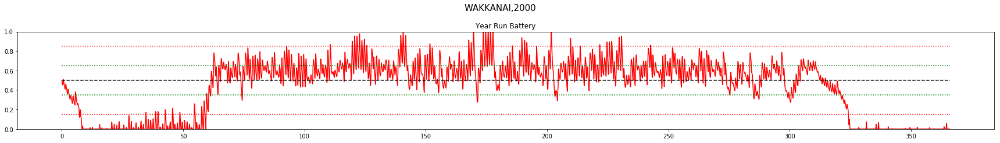



************************************
Day Violations           =    110
Battery Limit Violations =   1936
Battery FULL Violations  =     19
Battery EMPTY Violations =   1917


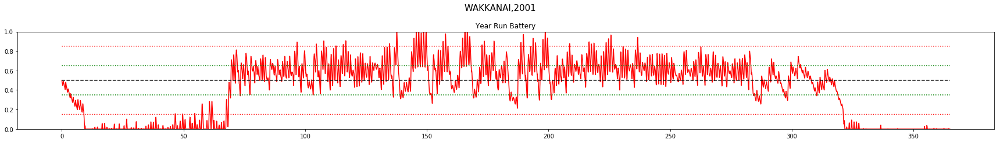



************************************
Day Violations           =     98
Battery Limit Violations =   1699
Battery FULL Violations  =     22
Battery EMPTY Violations =   1677


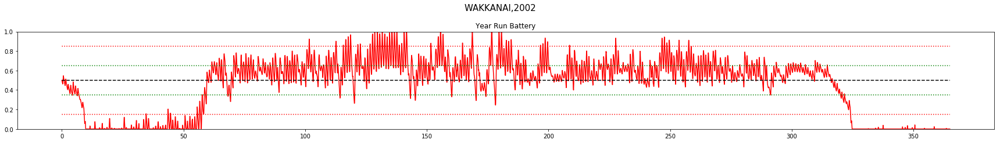



************************************
Day Violations           =     82
Battery Limit Violations =   1445
Battery FULL Violations  =      6
Battery EMPTY Violations =   1439


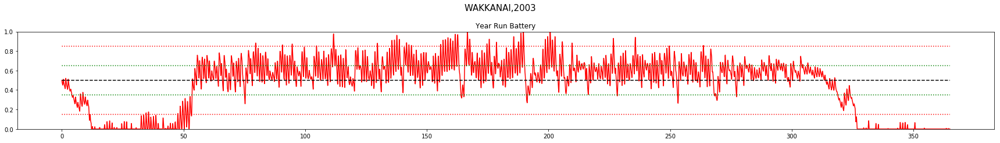



************************************
Day Violations           =     96
Battery Limit Violations =   1703
Battery FULL Violations  =     14
Battery EMPTY Violations =   1689


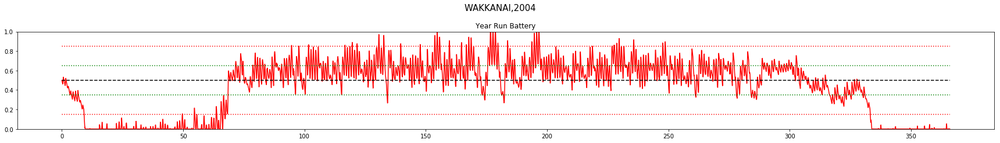



************************************
Day Violations           =    111
Battery Limit Violations =   1857
Battery FULL Violations  =     19
Battery EMPTY Violations =   1838


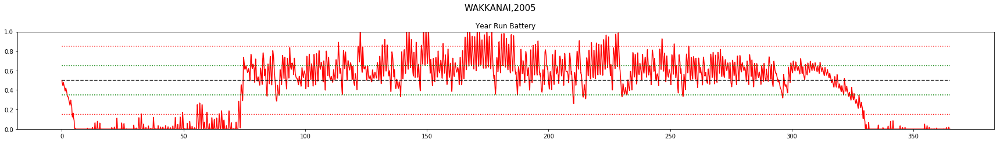



************************************
Day Violations           =    113
Battery Limit Violations =   1871
Battery FULL Violations  =     21
Battery EMPTY Violations =   1850


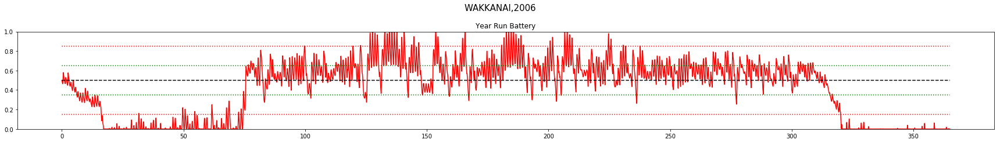



************************************
Day Violations           =    108
Battery Limit Violations =   1665
Battery FULL Violations  =     29
Battery EMPTY Violations =   1636


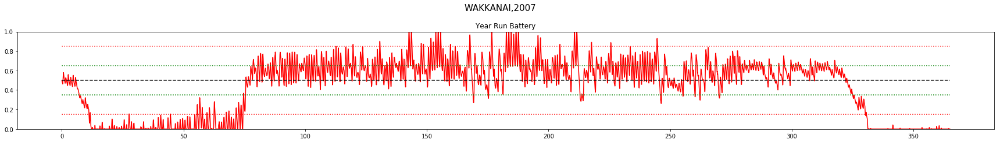



************************************
Day Violations           =     97
Battery Limit Violations =   1680
Battery FULL Violations  =      7
Battery EMPTY Violations =   1673


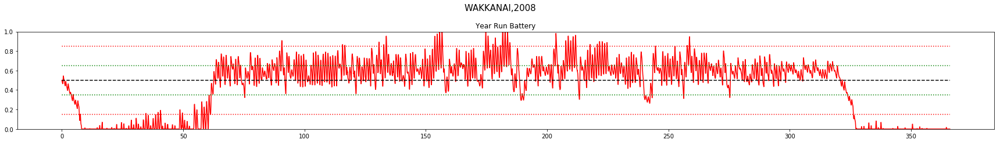



************************************
Day Violations           =    107
Battery Limit Violations =   1960
Battery FULL Violations  =     10
Battery EMPTY Violations =   1950


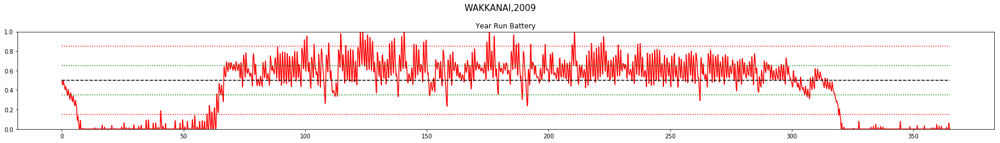



************************************
Day Violations           =    111
Battery Limit Violations =   1921
Battery FULL Violations  =     24
Battery EMPTY Violations =   1897


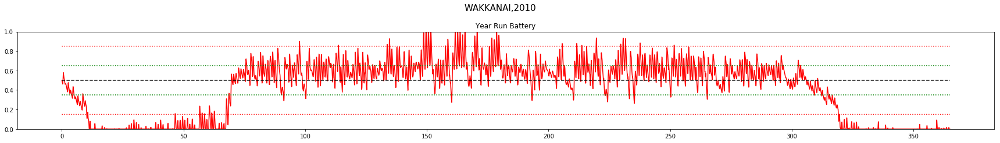



************************************
Day Violations           =    108
Battery Limit Violations =   1806
Battery FULL Violations  =      4
Battery EMPTY Violations =   1802


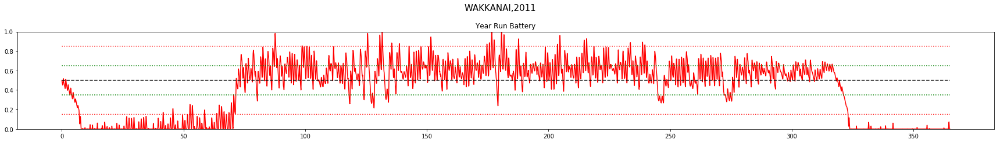



************************************
Day Violations           =    113
Battery Limit Violations =   2006
Battery FULL Violations  =     17
Battery EMPTY Violations =   1989


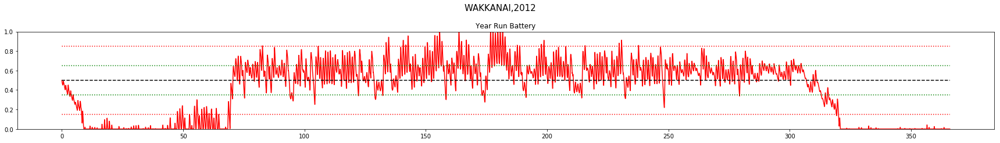



************************************
Day Violations           =    124
Battery Limit Violations =   2110
Battery FULL Violations  =      9
Battery EMPTY Violations =   2101


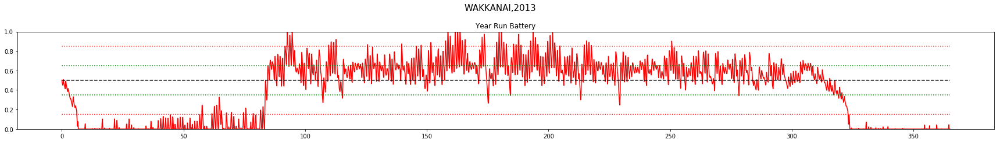



************************************
Day Violations           =    118
Battery Limit Violations =   2021
Battery FULL Violations  =     17
Battery EMPTY Violations =   2004


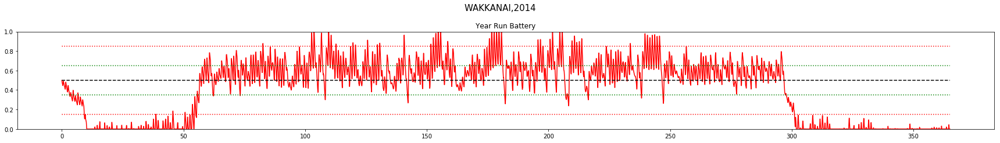



************************************
Day Violations           =    107
Battery Limit Violations =   1754
Battery FULL Violations  =     11
Battery EMPTY Violations =   1743


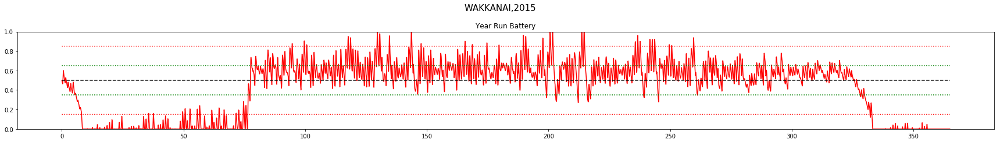



************************************
Day Violations           =    126
Battery Limit Violations =   2128
Battery FULL Violations  =     28
Battery EMPTY Violations =   2100


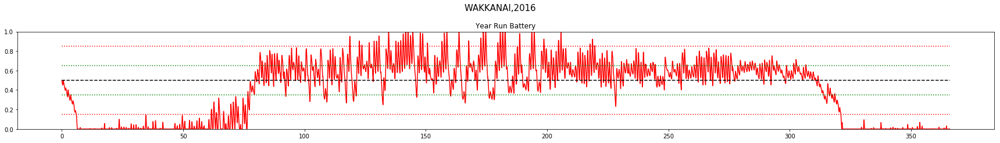



************************************
Day Violations           =    107
Battery Limit Violations =   1881
Battery FULL Violations  =     12
Battery EMPTY Violations =   1869


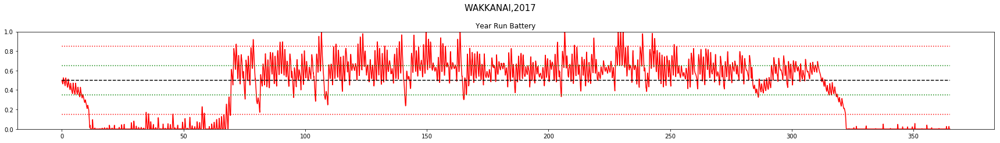



************************************
Day Violations           =    120
Battery Limit Violations =   2121
Battery FULL Violations  =     12
Battery EMPTY Violations =   2109


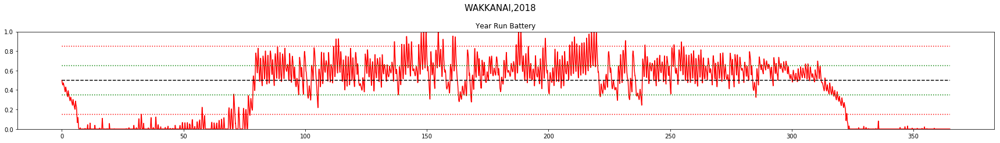



WAKKANAI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.13		100	 1708	1693	15
2001	 -0.07		110	 1936	1917	19
2002	 0.13		98	 1699	1677	22
2003	 0.41		82	 1445	1439	6
2004	 0.2		96	 1703	1689	14
2005	 -0.13		111	 1857	1838	19
2006	 -0.15		113	 1871	1850	21
2007	 0.03		108	 1665	1636	29
2008	 0.17		97	 1680	1673	7
2009	 -0.03		107	 1960	1950	10
2010	 -0.07		111	 1921	1897	24
2011	 -0.01		108	 1806	1802	4
2012	 -0.11		113	 2006	1989	17
2013	 -0.34		124	 2110	2101	9
2014	 -0.25		118	 2021	2004	17
2015	 0.01		107	 1754	1743	11
2016	 -0.35		126	 2128	2100	28
2017	 -0.01		107	 1881	1869	12
2018	 -0.23		120	 2121	2109	12

TOTAL Day  Violations:   2056.0
TOTAL Batt  Violations:  35272.0
TOTAL EMPTY Violations:  34976.0
TOTAL FULL  Violations:  296.0
************************************


************************************
Day Violations           =     74
Battery Limit Violations =   1157
Battery FULL Violations  =      9
Battery EMPTY Violations =   1148


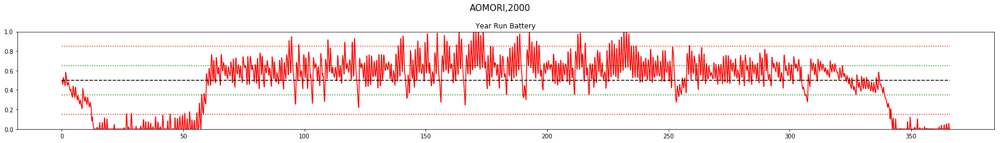



************************************
Day Violations           =     63
Battery Limit Violations =   1104
Battery FULL Violations  =      1
Battery EMPTY Violations =   1103


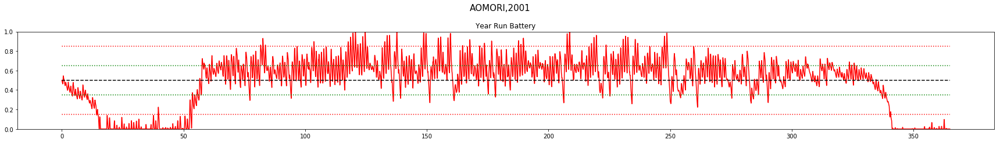



************************************
Day Violations           =    103
Battery Limit Violations =   1444
Battery FULL Violations  =     18
Battery EMPTY Violations =   1426


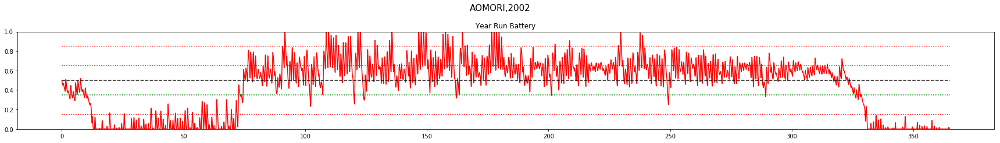



************************************
Day Violations           =     28
Battery Limit Violations =    532
Battery FULL Violations  =      5
Battery EMPTY Violations =    527


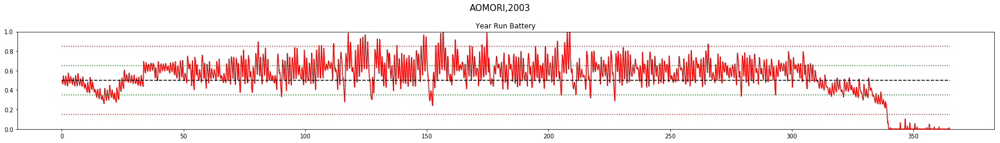



************************************
Day Violations           =     29
Battery Limit Violations =    457
Battery FULL Violations  =      9
Battery EMPTY Violations =    448


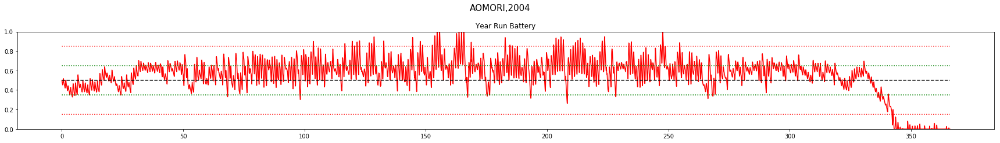



************************************
Day Violations           =     91
Battery Limit Violations =   1389
Battery FULL Violations  =      7
Battery EMPTY Violations =   1382


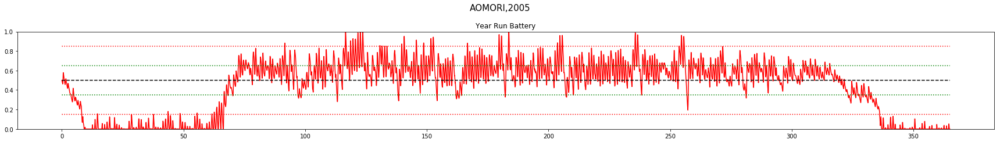



************************************
Day Violations           =     34
Battery Limit Violations =    605
Battery FULL Violations  =      4
Battery EMPTY Violations =    601


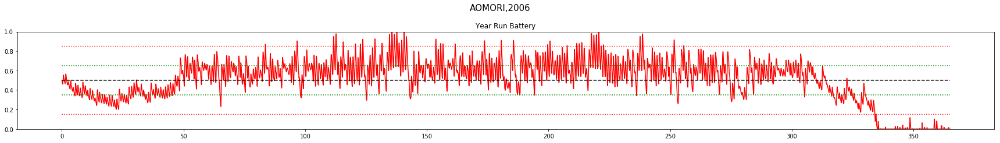



************************************
Day Violations           =     57
Battery Limit Violations =    793
Battery FULL Violations  =     35
Battery EMPTY Violations =    758


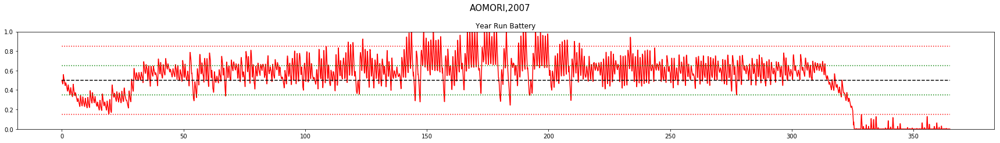



************************************
Day Violations           =     30
Battery Limit Violations =    439
Battery FULL Violations  =     16
Battery EMPTY Violations =    423


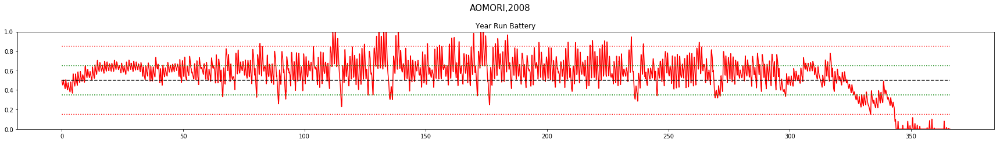



************************************
Day Violations           =     44
Battery Limit Violations =    791
Battery FULL Violations  =      8
Battery EMPTY Violations =    783


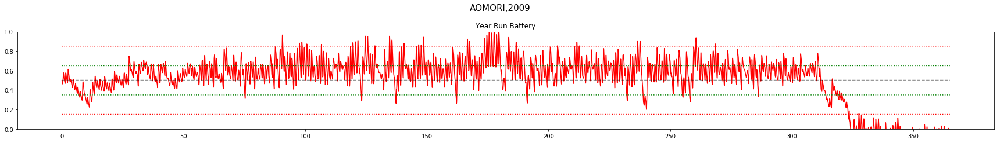



************************************
Day Violations           =     74
Battery Limit Violations =   1089
Battery FULL Violations  =     24
Battery EMPTY Violations =   1065


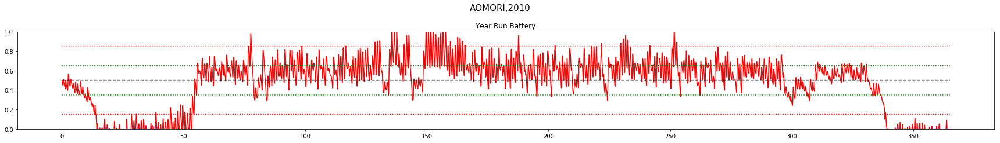



************************************
Day Violations           =     33
Battery Limit Violations =    626
Battery FULL Violations  =      5
Battery EMPTY Violations =    621


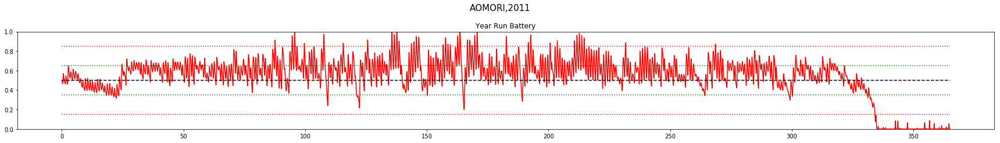



************************************
Day Violations           =     50
Battery Limit Violations =    818
Battery FULL Violations  =     26
Battery EMPTY Violations =    792


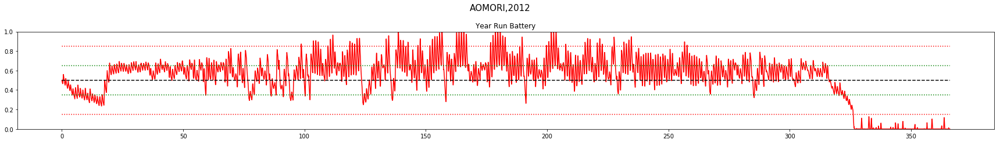



************************************
Day Violations           =     90
Battery Limit Violations =   1276
Battery FULL Violations  =     25
Battery EMPTY Violations =   1251


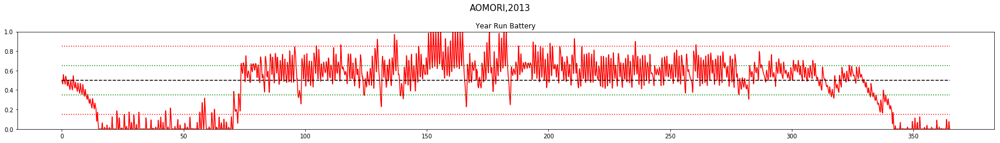



************************************
Day Violations           =     26
Battery Limit Violations =    459
Battery FULL Violations  =     12
Battery EMPTY Violations =    447


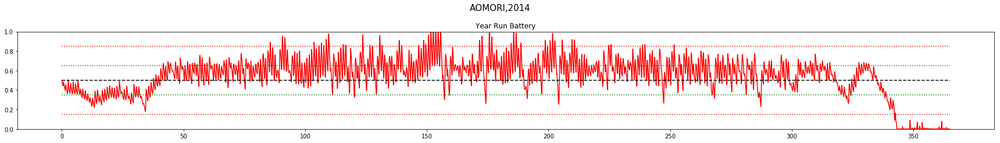



************************************
Day Violations           =     93
Battery Limit Violations =   1298
Battery FULL Violations  =     23
Battery EMPTY Violations =   1275


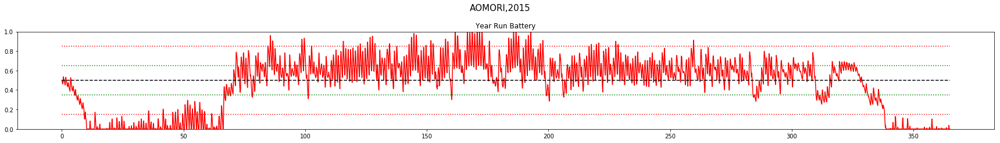



************************************
Day Violations           =     81
Battery Limit Violations =   1132
Battery FULL Violations  =     19
Battery EMPTY Violations =   1113


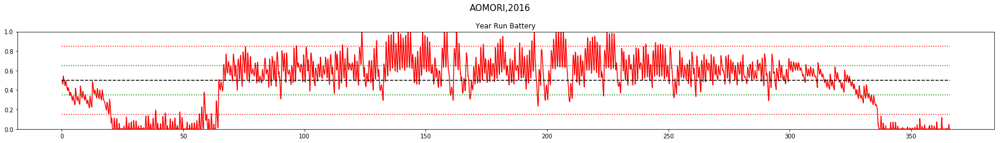



************************************
Day Violations           =     43
Battery Limit Violations =    721
Battery FULL Violations  =     13
Battery EMPTY Violations =    708


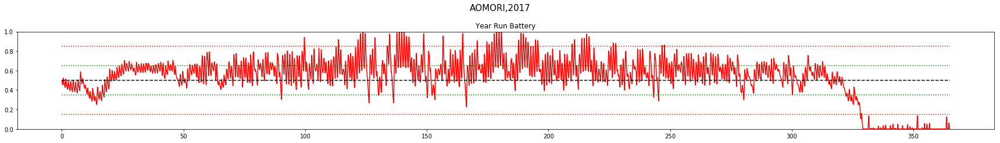



************************************
Day Violations           =     18
Battery Limit Violations =    229
Battery FULL Violations  =     12
Battery EMPTY Violations =    217


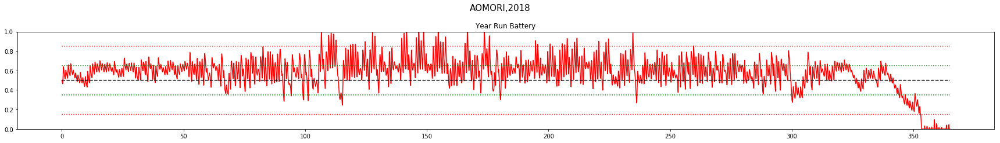



AOMORI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.59		74	 1157	1148	9
2001	 0.75		63	 1104	1103	1
2002	 0.09		103	 1444	1426	18
2003	 1.45		28	 532	527	5
2004	 1.47		29	 457	448	9
2005	 0.3		91	 1389	1382	7
2006	 1.31		34	 605	601	4
2007	 0.94		57	 793	758	35
2008	 1.43		30	 439	423	16
2009	 1.15		44	 791	783	8
2010	 0.61		74	 1089	1065	24
2011	 1.31		33	 626	621	5
2012	 1.05		50	 818	792	26
2013	 0.35		90	 1276	1251	25
2014	 1.46		26	 459	447	12
2015	 0.3		93	 1298	1275	23
2016	 0.45		81	 1132	1113	19
2017	 1.15		43	 721	708	13
2018	 1.64		18	 229	217	12

TOTAL Day  Violations:   1061.0
TOTAL Batt  Violations:  16359.0
TOTAL EMPTY Violations:  16088.0
TOTAL FULL  Violations:  271.0
************************************


************************************
Day Violations           =      1
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


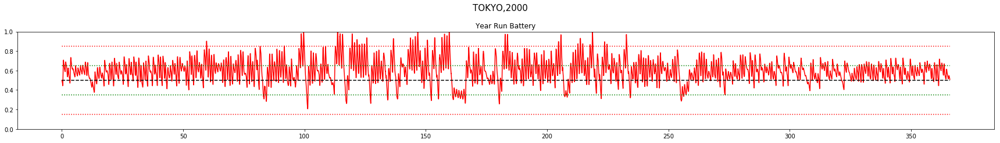



************************************
Day Violations           =      8
Battery Limit Violations =     12
Battery FULL Violations  =     12
Battery EMPTY Violations =      0


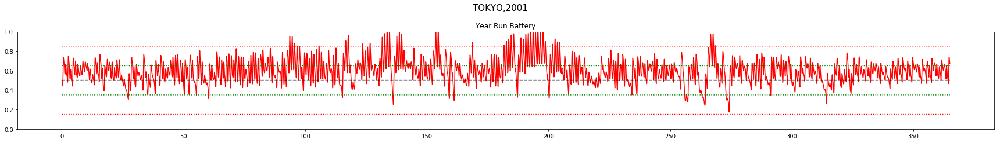



************************************
Day Violations           =      4
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


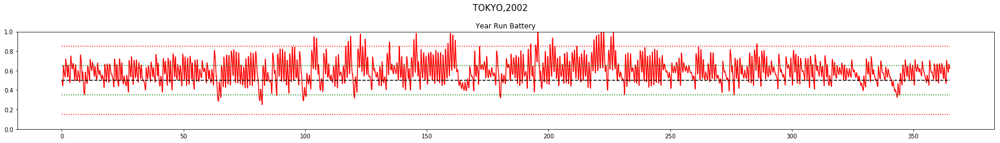



************************************
Day Violations           =      2
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


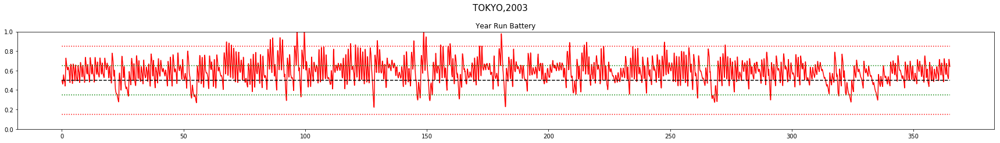



************************************
Day Violations           =      7
Battery Limit Violations =     13
Battery FULL Violations  =     13
Battery EMPTY Violations =      0


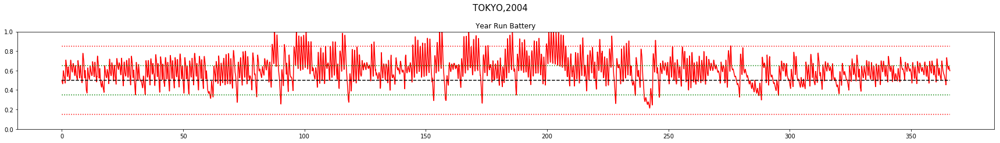



************************************
Day Violations           =      2
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


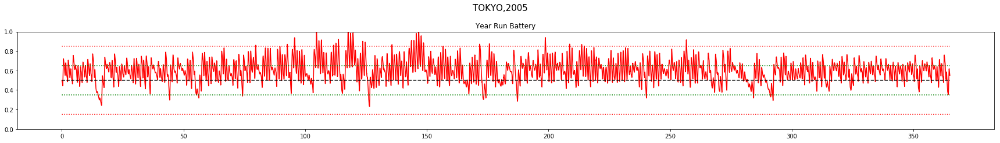



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


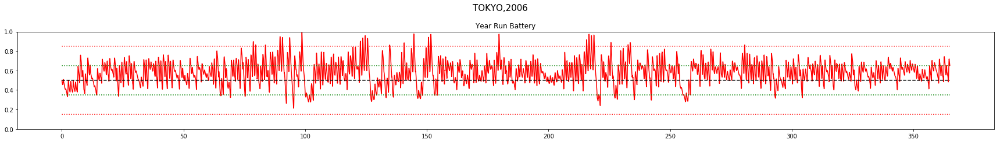



************************************
Day Violations           =      4
Battery Limit Violations =      7
Battery FULL Violations  =      7
Battery EMPTY Violations =      0


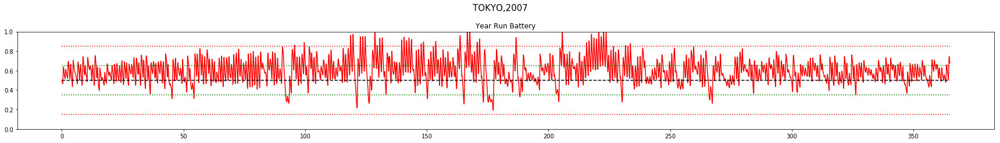



************************************
Day Violations           =      3
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


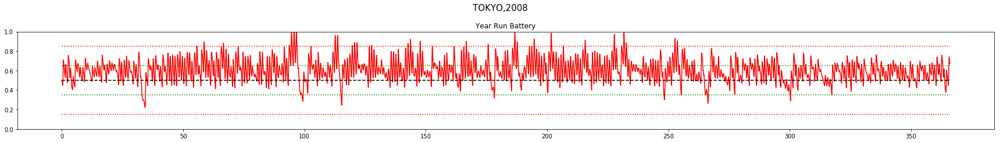



************************************
Day Violations           =      3
Battery Limit Violations =      7
Battery FULL Violations  =      7
Battery EMPTY Violations =      0


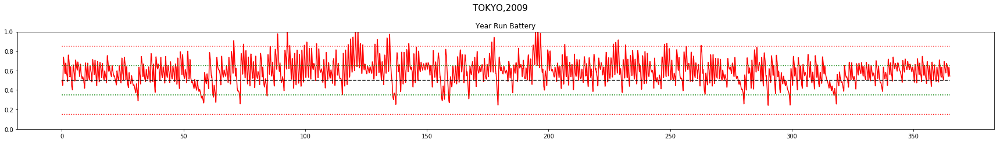



************************************
Day Violations           =     10
Battery Limit Violations =     21
Battery FULL Violations  =     21
Battery EMPTY Violations =      0


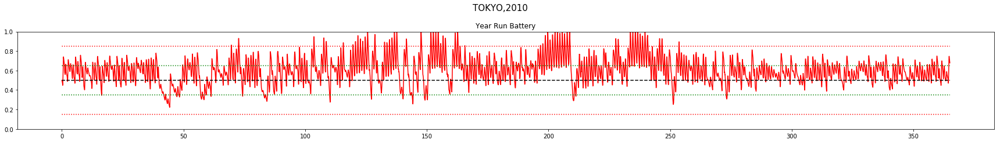



************************************
Day Violations           =      5
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


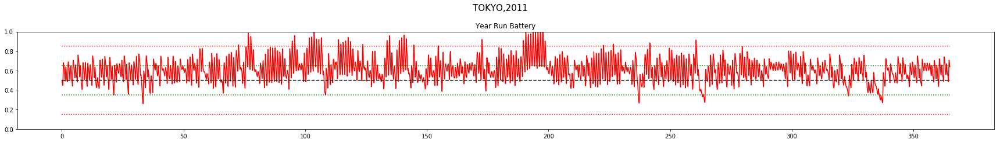



************************************
Day Violations           =      6
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


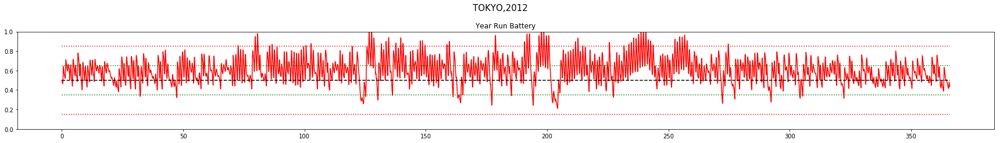



************************************
Day Violations           =      9
Battery Limit Violations =     15
Battery FULL Violations  =     15
Battery EMPTY Violations =      0


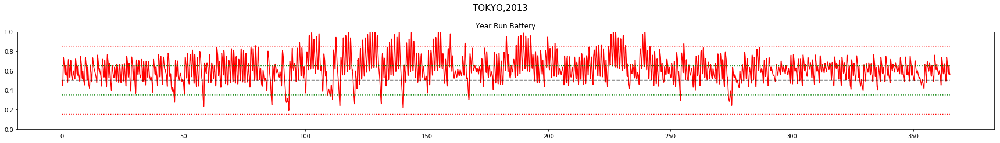



************************************
Day Violations           =     11
Battery Limit Violations =     23
Battery FULL Violations  =     23
Battery EMPTY Violations =      0


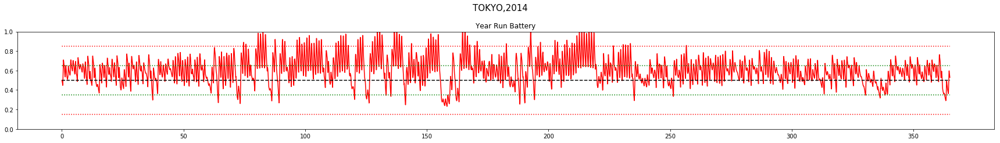



************************************
Day Violations           =      4
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


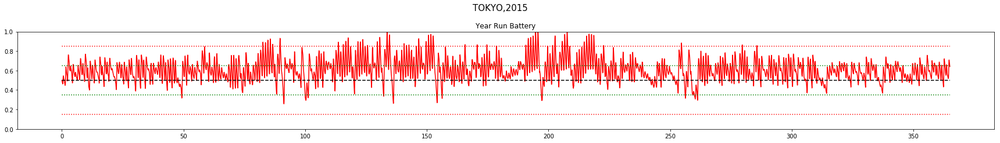



************************************
Day Violations           =      2
Battery Limit Violations =      4
Battery FULL Violations  =      4
Battery EMPTY Violations =      0


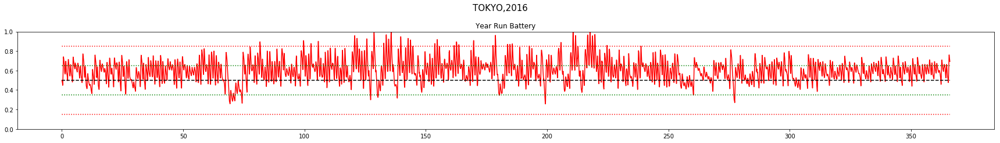



************************************
Day Violations           =      4
Battery Limit Violations =      7
Battery FULL Violations  =      7
Battery EMPTY Violations =      0


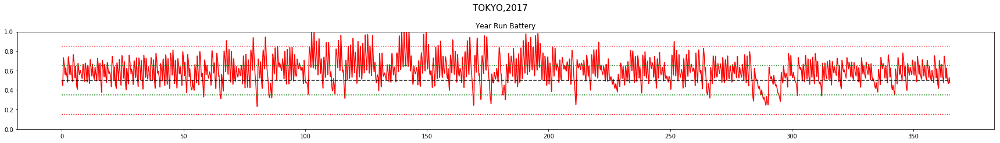



************************************
Day Violations           =     12
Battery Limit Violations =     22
Battery FULL Violations  =     22
Battery EMPTY Violations =      0


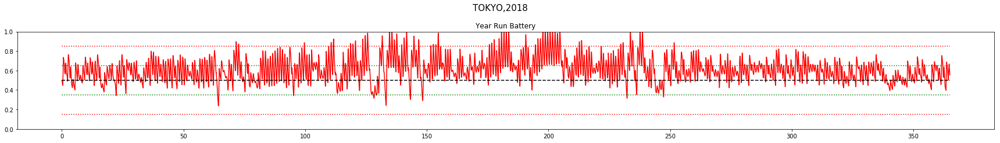



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.89		1	 2	0	2
2001	 1.8		8	 12	0	12
2002	 1.89		4	 5	0	5
2003	 1.93		2	 3	0	3
2004	 1.8		7	 13	0	13
2005	 1.93		2	 3	0	3
2006	 1.93		0	 0	0	0
2007	 1.88		4	 7	0	7
2008	 1.91		3	 5	0	5
2009	 1.92		3	 7	0	7
2010	 1.72		10	 21	0	21
2011	 1.87		5	 10	0	10
2012	 1.83		6	 8	0	8
2013	 1.76		9	 15	0	15
2014	 1.72		11	 23	0	23
2015	 1.89		4	 6	0	6
2016	 1.93		2	 4	0	4
2017	 1.86		4	 7	0	7
2018	 1.75		12	 22	0	22

TOTAL Day  Violations:   97.0
TOTAL Batt  Violations:  173.0
TOTAL EMPTY Violations:  0.0
TOTAL FULL  Violations:  173.0
************************************


************************************
Day Violations           =     13
Battery Limit Violations =     23
Battery FULL Violations  =     23
Battery EMPTY Violations =      0


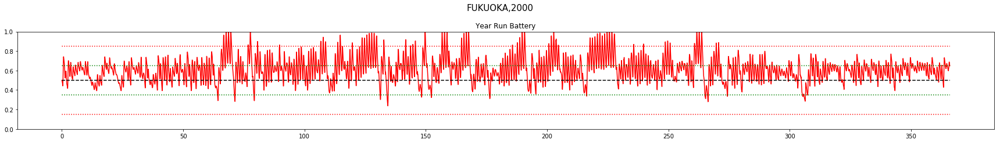



************************************
Day Violations           =     14
Battery Limit Violations =     32
Battery FULL Violations  =     32
Battery EMPTY Violations =      0


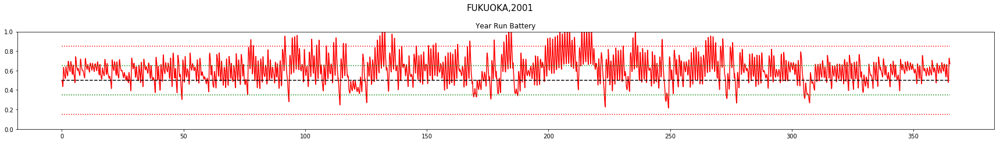



************************************
Day Violations           =     10
Battery Limit Violations =     22
Battery FULL Violations  =     22
Battery EMPTY Violations =      0


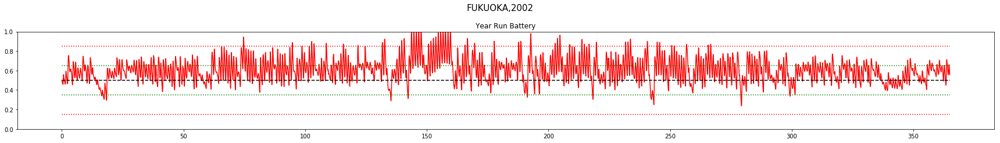



************************************
Day Violations           =      3
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


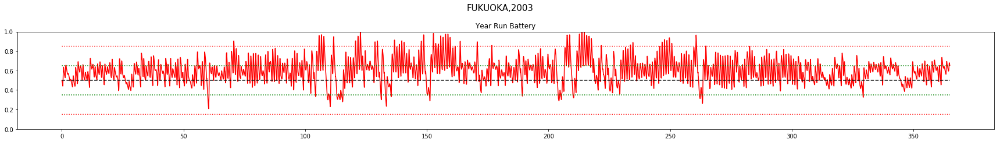



************************************
Day Violations           =      9
Battery Limit Violations =     19
Battery FULL Violations  =     19
Battery EMPTY Violations =      0


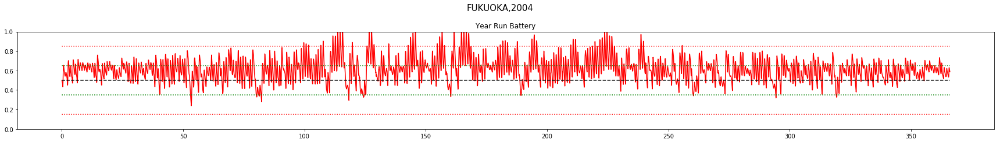



************************************
Day Violations           =     10
Battery Limit Violations =     22
Battery FULL Violations  =     22
Battery EMPTY Violations =      0


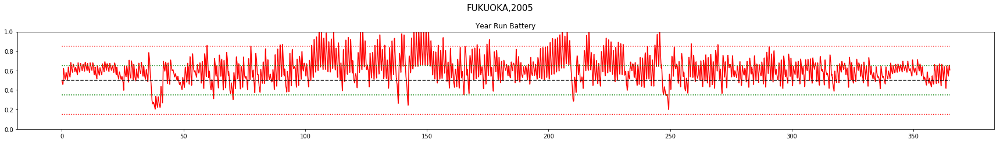



************************************
Day Violations           =     11
Battery Limit Violations =     20
Battery FULL Violations  =     20
Battery EMPTY Violations =      0


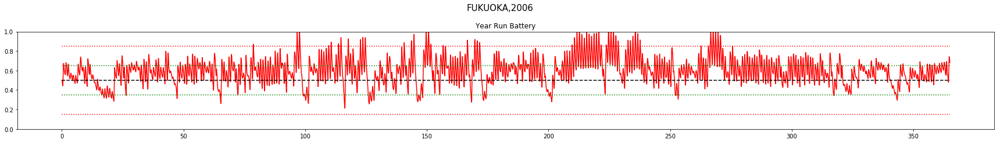



************************************
Day Violations           =      5
Battery Limit Violations =      9
Battery FULL Violations  =      9
Battery EMPTY Violations =      0


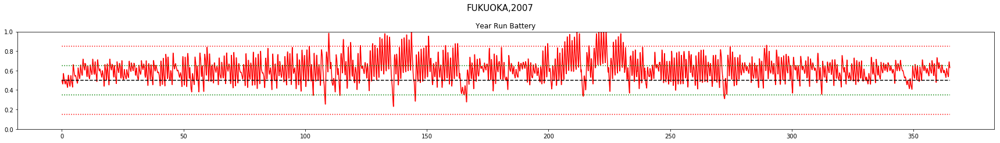



************************************
Day Violations           =      3
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


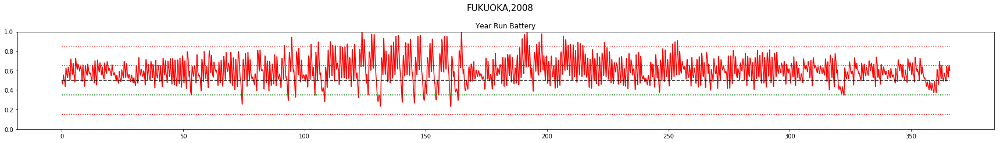



************************************
Day Violations           =     11
Battery Limit Violations =     34
Battery FULL Violations  =     17
Battery EMPTY Violations =     17


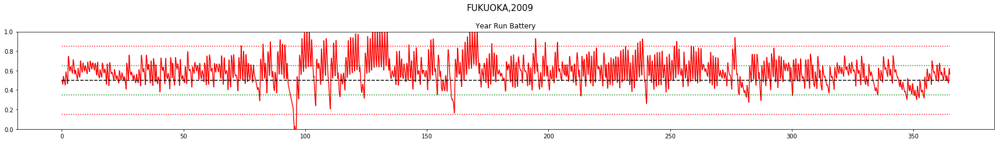



************************************
Day Violations           =      4
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


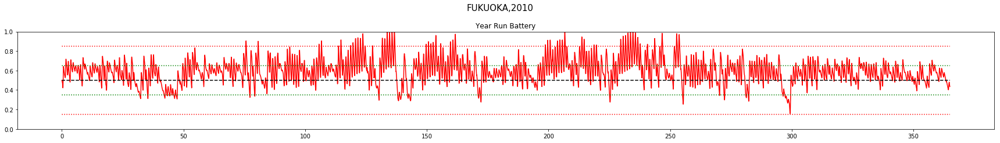



************************************
Day Violations           =      4
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


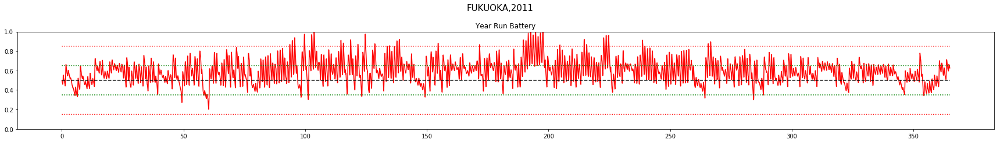



************************************
Day Violations           =      2
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


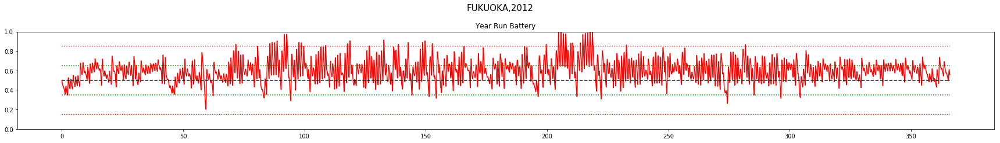



************************************
Day Violations           =     13
Battery Limit Violations =     23
Battery FULL Violations  =     23
Battery EMPTY Violations =      0


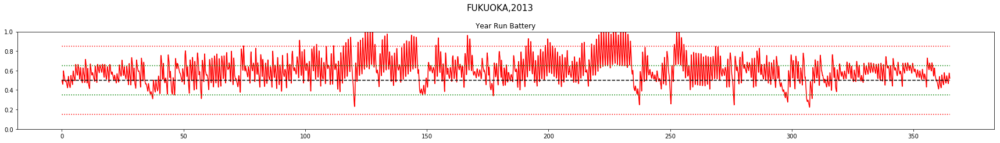



************************************
Day Violations           =      3
Battery Limit Violations =      4
Battery FULL Violations  =      4
Battery EMPTY Violations =      0


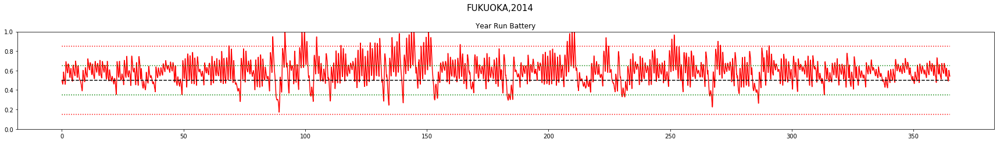



************************************
Day Violations           =     11
Battery Limit Violations =     17
Battery FULL Violations  =     17
Battery EMPTY Violations =      0


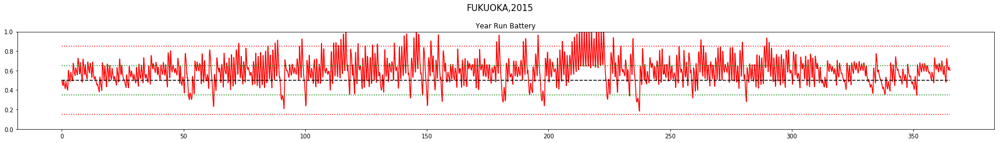



************************************
Day Violations           =     13
Battery Limit Violations =     25
Battery FULL Violations  =     25
Battery EMPTY Violations =      0


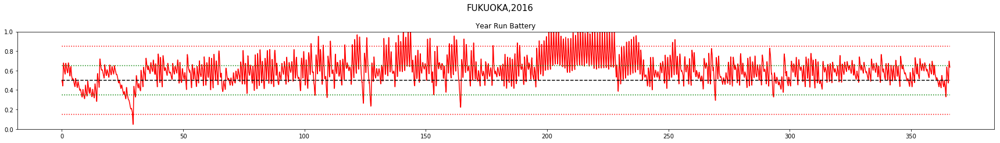



************************************
Day Violations           =     10
Battery Limit Violations =     17
Battery FULL Violations  =     17
Battery EMPTY Violations =      0


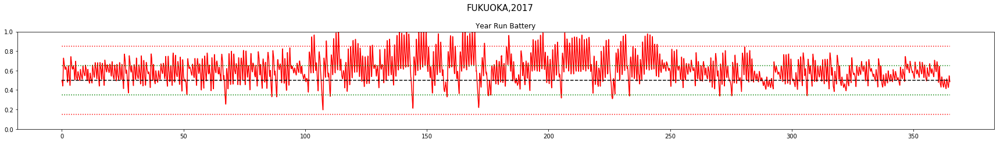



************************************
Day Violations           =     20
Battery Limit Violations =     34
Battery FULL Violations  =     34
Battery EMPTY Violations =      0


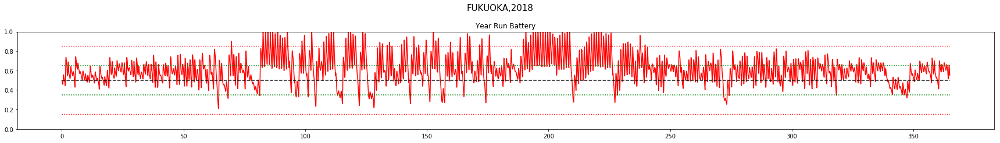



FUKUOKA
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.7		13	 23	0	23
2001	 1.72		14	 32	0	32
2002	 1.83		10	 22	0	22
2003	 1.87		3	 6	0	6
2004	 1.81		9	 19	0	19
2005	 1.76		10	 22	0	22
2006	 1.75		11	 20	0	20
2007	 1.86		5	 9	0	9
2008	 1.9		3	 6	0	6
2009	 1.79		11	 34	17	17
2010	 1.86		4	 6	0	6
2011	 1.89		4	 8	0	8
2012	 1.92		2	 3	0	3
2013	 1.73		13	 23	0	23
2014	 1.89		3	 4	0	4
2015	 1.81		11	 17	0	17
2016	 1.69		13	 25	0	25
2017	 1.74		10	 17	0	17
2018	 1.54		20	 34	0	34

TOTAL Day  Violations:   169.0
TOTAL Batt  Violations:  330.0
TOTAL EMPTY Violations:  17.0
TOTAL FULL  Violations:  313.0
************************************


************************************
Day Violations           =     20
Battery Limit Violations =     38
Battery FULL Violations  =     38
Battery EMPTY Violations =      0


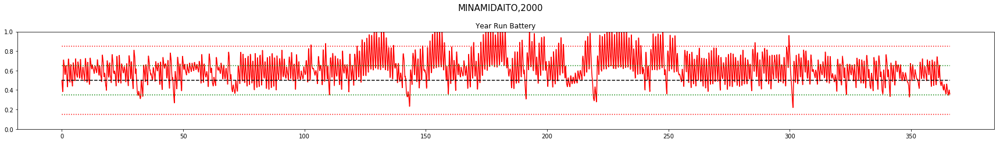



************************************
Day Violations           =     42
Battery Limit Violations =     88
Battery FULL Violations  =     88
Battery EMPTY Violations =      0


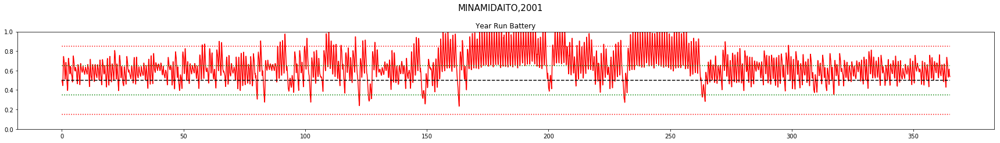



************************************
Day Violations           =     27
Battery Limit Violations =     50
Battery FULL Violations  =     50
Battery EMPTY Violations =      0


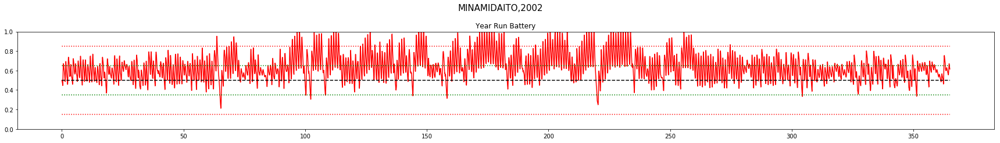



************************************
Day Violations           =     34
Battery Limit Violations =     73
Battery FULL Violations  =     73
Battery EMPTY Violations =      0


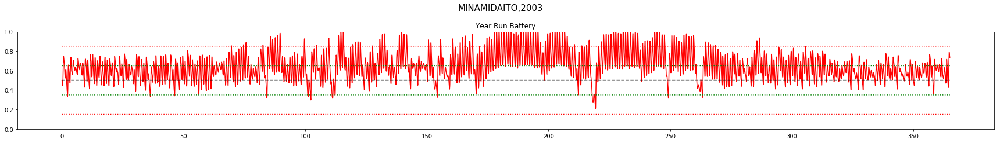



************************************
Day Violations           =     26
Battery Limit Violations =     55
Battery FULL Violations  =     55
Battery EMPTY Violations =      0


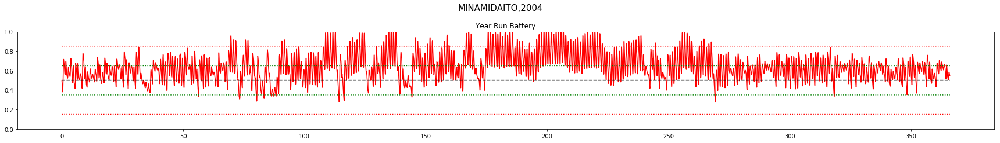



************************************
Day Violations           =     15
Battery Limit Violations =     28
Battery FULL Violations  =     27
Battery EMPTY Violations =      1


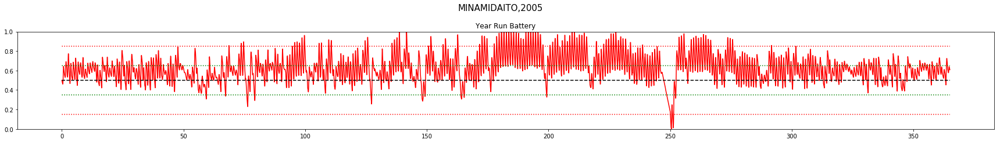



************************************
Day Violations           =     35
Battery Limit Violations =     71
Battery FULL Violations  =     71
Battery EMPTY Violations =      0


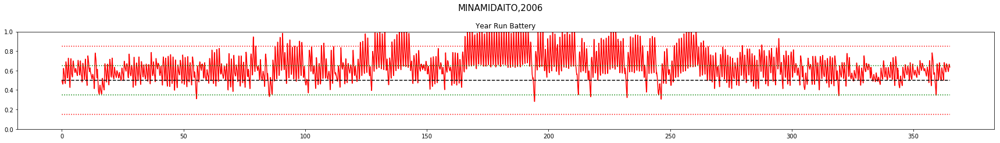



************************************
Day Violations           =     18
Battery Limit Violations =     41
Battery FULL Violations  =     41
Battery EMPTY Violations =      0


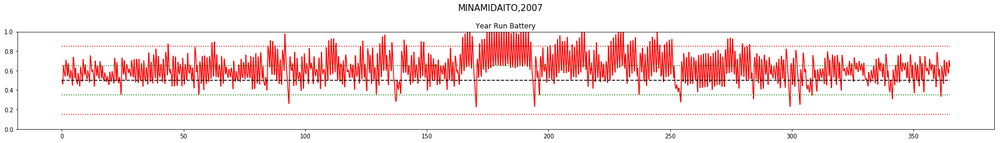



************************************
Day Violations           =     12
Battery Limit Violations =     20
Battery FULL Violations  =     20
Battery EMPTY Violations =      0


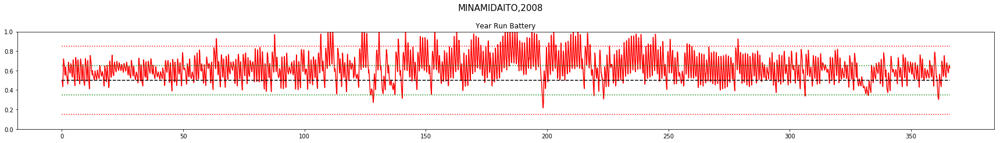



************************************
Day Violations           =     23
Battery Limit Violations =     48
Battery FULL Violations  =     48
Battery EMPTY Violations =      0


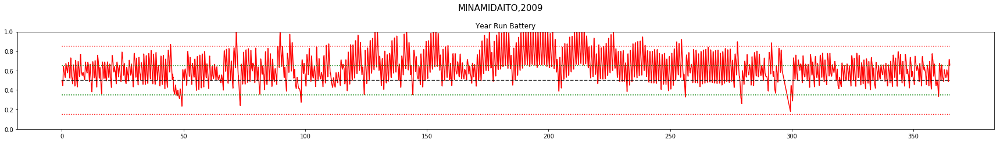



************************************
Day Violations           =     23
Battery Limit Violations =     48
Battery FULL Violations  =     48
Battery EMPTY Violations =      0


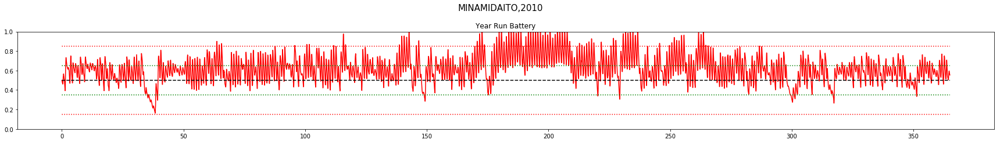



************************************
Day Violations           =     42
Battery Limit Violations =     82
Battery FULL Violations  =     82
Battery EMPTY Violations =      0


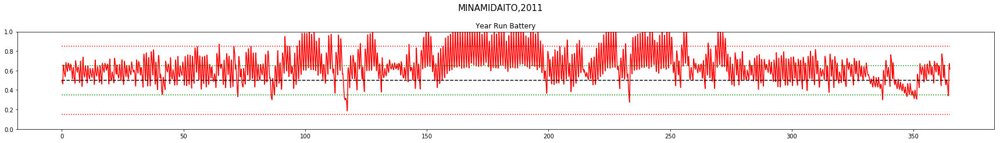



************************************
Day Violations           =     19
Battery Limit Violations =    128
Battery FULL Violations  =     22
Battery EMPTY Violations =    106


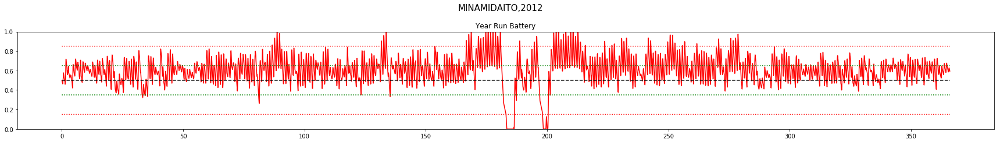



************************************
Day Violations           =     35
Battery Limit Violations =     72
Battery FULL Violations  =     72
Battery EMPTY Violations =      0


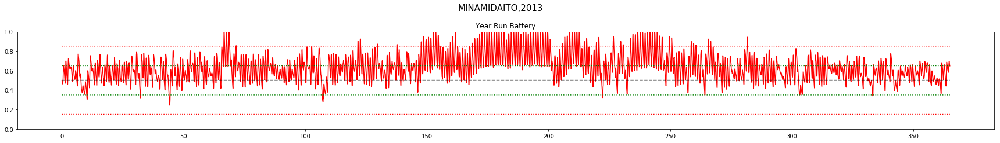



************************************
Day Violations           =     27
Battery Limit Violations =     56
Battery FULL Violations  =     56
Battery EMPTY Violations =      0


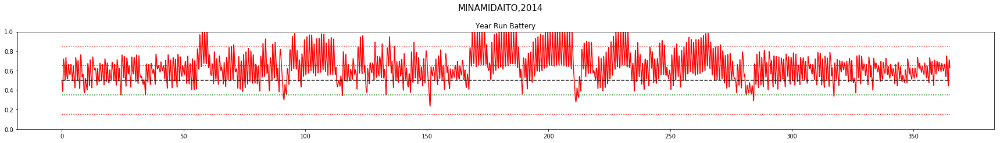



************************************
Day Violations           =     27
Battery Limit Violations =     52
Battery FULL Violations  =     52
Battery EMPTY Violations =      0


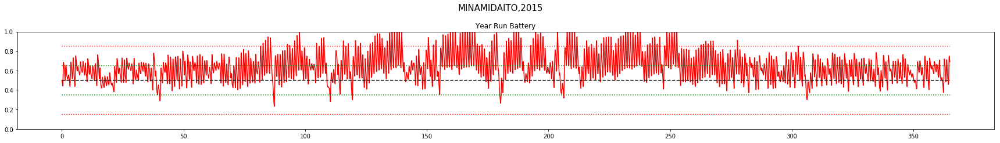



************************************
Day Violations           =     37
Battery Limit Violations =     87
Battery FULL Violations  =     87
Battery EMPTY Violations =      0


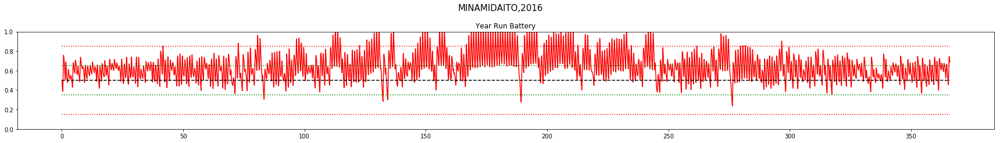



************************************
Day Violations           =     29
Battery Limit Violations =     63
Battery FULL Violations  =     63
Battery EMPTY Violations =      0


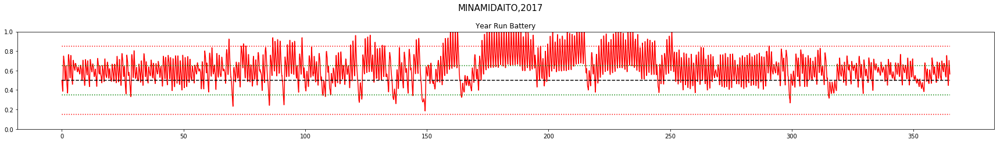



************************************
Day Violations           =     23
Battery Limit Violations =     44
Battery FULL Violations  =     44
Battery EMPTY Violations =      0


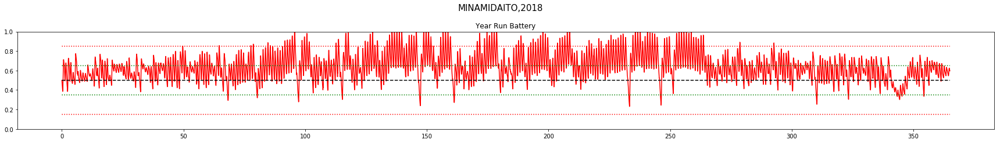



MINAMIDAITO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.56		20	 38	0	38
2001	 1.22		42	 88	0	88
2002	 1.44		27	 50	0	50
2003	 1.33		34	 73	0	73
2004	 1.48		26	 55	0	55
2005	 1.59		15	 28	1	27
2006	 1.34		35	 71	0	71
2007	 1.66		18	 41	0	41
2008	 1.65		12	 20	0	20
2009	 1.58		23	 48	0	48
2010	 1.56		23	 48	0	48
2011	 1.2		42	 82	0	82
2012	 1.6		19	 128	106	22
2013	 1.37		35	 72	0	72
2014	 1.48		27	 56	0	56
2015	 1.49		27	 52	0	52
2016	 1.31		37	 87	0	87
2017	 1.48		29	 63	0	63
2018	 1.45		23	 44	0	44

TOTAL Day  Violations:   514.0
TOTAL Batt  Violations:  1144.0
TOTAL EMPTY Violations:  107.0
TOTAL FULL  Violations:  1037.0
************************************


In [46]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(6)
    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
        print("\n\n************************************")
        print("Day Violations           = {:6d}".format(capm.violation_counter))
        print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

    #         ax1 = fig.add_subplot(211)
    #         ax1.plot(yr_test_reward_rec)
    #         ax1.set_title("\n\nYear Run Reward")
    #         ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(211)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################


    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

    print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
    print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
    print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
    print("************************************")

In [23]:
print('\nRun time: {}'.format(datetime.now() - tic))


Run time: 0:03:59.500307


In [24]:
# YEAR = 2000

In [25]:
# capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
# capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
# capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

# s, r, day_end, year_end = capm.reset()
# yr_test_record = np.empty(4)

# while True:
#     a = dqn.choose_greedy_action(stdize(s))

#     #state = [batt, enp, henergy, fcast]
#     yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

#     # take action
#     s_, r, day_end, year_end = capm.step(a)

#     if year_end:
#         break

#     s = s_

# yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
# yr_test_reward_rec = yr_test_record[:,2]
# yr_test_reward_rec = yr_test_reward_rec[::24]

# title = LOCATION.upper() + ',' + str(YEAR)
# NO_OF_DAYS = capm.eno.NO_OF_DAYS

# fig = plt.figure(figsize=(24,6))
# fig.suptitle(title, fontsize=15)

# #     ax1 = fig.add_subplot(211)
# #     ax1.plot(yr_test_reward_rec)
# #     ax1.set_title("\n\nYear Run Reward")
# #     ax1.set_ylim([-3,3])

# #Plot the reward and battery for the entire year run
# ax2 = fig.add_subplot(111)
# ax2.plot(yr_test_record[:,0],'r')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
# ax2.set_title("\n\nYear Run Battery")
# ax2.set_ylim([0,1])
# plt.sca(ax2)
# plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
# fig.tight_layout()
# plt.show()

In [26]:
# DAY_START = 320
# DAY_END   = 325

In [27]:
# #Plot the reward and battery for the entire year run on a day by day basis
# title = LOCATION.upper() + ',' + str(YEAR)
# TIME_AXIS = np.arange(0,capm.eno.TIME_STEPS)
# for DAY in range(DAY_START,DAY_END):
#     START = DAY*24
#     END = START+24

#     daytitle = title + ' - DAY ' + str(DAY)
#     fig = plt.figure(figsize=(16,4))
#     st = fig.suptitle(daytitle)

#     ax2 = fig.add_subplot(121)
#     ax2.plot(yr_test_record[START:END,1],'g')
#     ax2.set_title("HARVESTED ENERGY")
#     ax2.set_xlabel("Hour")
#     ax2.set_ylim([0,1.05])
    
#     ax2.text(0.1, 0.6, "TENP = %.2f\n" %(capm.BOPT/capm.BMAX-yr_test_record[END,0]),fontsize=11, ha='left')
#     ax2.text(0.1, 0.5, "BMEAN = %.2f\n" %(np.mean(yr_test_record[START:END,0])),fontsize=11, ha='left')
#     ax2.text(0.1, 0.4, "BINIT = %.2f\n" %(yr_test_record[START,0]),fontsize=11, ha='left')
#     if END < (capm.eno.NO_OF_DAYS*capm.eno.TIME_STEPS):
#         ax2.text(0.1, 0.1, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=13, ha='left')
        
#     #plot battery for year run
#     ax1 = fig.add_subplot(122)
#     ax1.plot(TIME_AXIS,              yr_test_record[START:END,0],'r')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BOPT/capm.BMAX, 'r--')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_LO/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_HI/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:',alpha=0.5)
    
#     ax1.set_title("YEAR RUN TEST")
#     ax1.set_xlabel("Hour")
#     ax1.set_ylabel('Battery', color='r',fontsize=12)
#     ax1.set_ylim([-0.05,1.05])

#     #plot actions for year run
#     ax1a = ax1.twinx()
#     ax1a.plot(yr_test_record[START:END,3]+1)
#     ax1a.set_ylim([0,N_ACTIONS])
#     ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)
#     ax1a.set_ylim([0,10.25])


#     fig.tight_layout()
#     st.set_y(0.95)
#     fig.subplots_adjust(top=0.75)
#     plt.show()